In [1]:
### odovzdanie 2 a 3 som robil sam, bez dvojice ###

# Thyroid dataset

Disclaimer: some decisions in this notebook were made just to enhance data handling and may be not optimal, considering both time complexity and memory requirements

In [2]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import Imputer, LabelEncoder
from sklearn.neighbors import NearestNeighbors
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, train_test_split
import sklearn.metrics as metrics
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import sys
from IPython.display import display
import itertools

Prepare script execution for test set

In [4]:
file_name_base = 'train' # default
MODE_SCRIPT = len(sys.argv) == 3 and sys.argv[1]=='-script'

if MODE_SCRIPT:
    # script execution
    # usage:
    # -script <file_name_base>
    file_name_base = sys.argv[2]
else:
    # run in jupyter notebook
    %matplotlib inline

### Utilities

In [5]:
def percent(number, prec=2):
    return '{} %'.format(round(number*100, prec))

In [6]:
# filter rows with all unknown columns
def all_nan_cols(data_frame):
    return data_frame[data_frame.isnull().all(axis=1)]

# filter rows with at least 1 unknown column
def any_nan_cols(data_frame):
    return data_frame[data_frame.isnull().any(axis=1)]

# filter rows with no unknown columns
def no_nan_cols(data_frame):
    return data_frame[data_frame.notnull().all(axis=1)]

In [7]:
# list column names of specific type from dataframe
def getcols(data_frame, compare_type):
    return [col for col in data_frame if data_frame[col].dtype==compare_type]

# string columns
def scols(data_frame):
    return getcols(data_frame, compare_type=object)

# boolean columns
def bcols(data_frame):
    return getcols(data_frame, compare_type=bool)

# integer columns
def icols(data_frame):
    return getcols(data_frame, compare_type=np.int64)

# decimal columns
def fcols(data_frame):
    return getcols(data_frame, compare_type=np.float64)

# categorical columns
def catcols(data_frame):
    return scols(data_frame) + bcols(data_frame)

# numeric columns
def numcols(data_frame):
    return icols(data_frame) + fcols(data_frame)

In [8]:
# Modified imputer allows substitution with mode, which can be used for categorical variables
# https://stackoverflow.com/a/45228286/5148218
class CatImputer(Imputer):
    def __init__(self, **kwargs):
        Imputer.__init__(self, **kwargs)

    def fit(self, X, y=None):
        # modify most_frequent strategy to be able to process categorical
        if self.strategy == 'most_frequent':
            self.fills = pd.DataFrame(X).mode(axis=0).squeeze()
            self.statistics_ = self.fills.values
            return self
        else:
            return Imputer.fit(self, X, y=y)

    def transform(self, X):
        if hasattr(self, 'fills'):
            return pd.DataFrame(X).fillna(self.fills).values.astype(str)
        else:
            return Imputer.transform(self, X)

### Plotting toolbox

In [9]:
# bar chart
def bar(series, title=None):
    plt.figure()
    ax = series.value_counts().plot(kind='bar', title=title)
    # https://stackoverflow.com/questions/25447700/annotate-bars-with-values-on-pandas-bar-plots
    for p in ax.patches:
        ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))
    plt.show()
    plt.close()
    
# histogram
def hist(series, title=None, bins=20):
    plt.figure()
    series.plot(kind='hist', bins=bins, title=title)
    plt.show()
    plt.close()
    
# box plot
def box(series, title=None):
    plt.figure()
    series.plot(kind='box', title=title)
    plt.show()
    plt.close()

# violin plot
def violin(series):
    plt.figure()
    sns.violinplot(series)
    plt.show()
    plt.close()
    
# series of plots for continuous variables
def contplot(series, bins=20):
    hist(series, title=series.name, bins=bins)
    box(series)
    violin(series)

# scatter plot
def scatter(series_x, series_y, color_series=None):
    plt.figure(figsize=[8,8])
    plt.scatter(series_x, series_y, s=7, alpha=.5, label=None, c=color_series)
    plt.xlabel(series_x.name)
    plt.ylabel(series_y.name)
    plt.show()
    plt.close()

# q-q plot
def qqplot(series, title=None):
    plt.figure(figsize=[5,5])
    stats.probplot(series, plot=plt); # default is normal distribution
    plt.title(title)
    plt.show()
    plt.close()

# heatmap
def hm(frame, xlabels=True, ylabels=True, title=None): 
    plt.figure(figsize=[10,10])
    sns.heatmap(frame, cmap='seismic', xticklabels=xlabels, yticklabels=ylabels, square=True)
    plt.xticks(rotation=60)
    plt.title(title)
    plt.show()
    plt.close

### IO CSV

In [10]:
def load_csv(path):
    print('Load data from {}'.format(path))
    return pd.read_csv(path, index_col=0)

def save_csv(frame, path):
    print('Save data to {}'.format(path))
    frame.to_csv(path)

### Paths

In [11]:
FILE_PATH = './{}.csv'
FILE_PATH_POLISHED = './{}_polished.csv'
FILE_PATH_GLOBAL = './{}_global.csv'
FILE_PATH_GLOBAL_REMOVAL = './{}_global_removal.csv'
FILE_PATH_GLOBAL_PERCENTILE = './{}_global_percentile.csv'
FILE_PATH_KNN = './{}_knn.csv'
FILE_PATH_KNN_REMOVAL = './{}_knn_removal.csv'
FILE_PATH_KNN_PERCENTILE = './{}_knn_percentile.csv'

## Polish

First look at data

In [12]:
df = load_csv(FILE_PATH.format(file_name_base))
pd.set_option('display.max_columns', 500) # ensure display all columns
pd.set_option('display.max_colwidth', -1) # ensure display full values
display(df.head(3))

Load data from ./train.csv


,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,TBG measured,TBG,referral source,class,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,date_of_birth,medical_info
0,48.0,f,f,f,f,f,f,f,f,f,0.200,t,1.8,104.0,1.11,t,f,?,SVI,negative.|637,Private,122048,HS-grad,9.0,Never-married,Machine-op-inspct,Other-relative,White,0,0,40,United-States,1969-12-12,"{'TSH measured':'t','sex':'F','query hyperthyroid':'f','TT4 measured':'t','on antithyroid medication':'f','FTI':'94','sick':'F','T4U measured':'t','psych':'f','query hypothyroid':'f'}"
1,74.0,f,f,f,f,f,f,f,t,f,0.025,t,2.2,108.0,0.85,NaN,f,?,other,negative.|1235,Private,199268,Some-college,10.0,Never-married,Other-service,Own-child,White,0,0,20,United-States,1943-10-06,"{'TSH measured':'t','sex':'F','query hyperthyroid':'f','TT4 measured':'t','on antithyroid medication':'f','FTI':'126','sick':'f','T4U measured':'t','psych':'f','query hypothyroid':'f'}"
2,60.0,f,f,f,f,f,f,f,f,f,151.000,t,1.4,42.0,1.06,t,f,?,other,negative.|2654,Local-gov,283635,Masters,14.0,Divorced,Prof-specialty,Not-in-family,White,0,0,40,United-States,1957-11-11,"{'TSH measured':'t','sex':'F','query hyperthyroid':'f','TT4 measured':'t','on antithyroid medication':'f','FTI':'39','sick':'f','T4U measured':'t','psych':'f','query hypothyroid':'f'}"


Some columns can be divided into more

In [13]:
df = pd.concat([df.drop(['medical_info'], axis=1), df['medical_info'].apply(eval).apply(pd.Series)], axis=1)

In [14]:
display(df[df['class'].apply(lambda x: len(x.split('.')) != 2)])

,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,TBG measured,TBG,referral source,class,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,date_of_birth,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick


Every element cointains dot, so that we can split on it

In [15]:
df[['class_sick','class_num']] = pd.DataFrame(df['class'].apply(lambda x: x.split('.')).values.tolist(), index=df.index)
df.drop(['class'], axis=1, inplace=True)
[print(col, df[col].unique()) for col in ['class_sick','class_num']];

class_sick ['negative' 'sick']
class_num ['|637' '|1235' '|2654' ... '|3746' '_1500' '|3178']


We do not need separator now, let's just see now how to format prediction later

In [16]:
display(df['class_num'].apply(lambda x: x[0]).value_counts())

|    2520
_    280 
Name: class_num, dtype: int64

In [17]:
df['class_num'] = df['class_num'].apply(lambda x: x.replace('|','').replace('_',''))
display(df.head())

,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,TBG measured,TBG,referral source,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,date_of_birth,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick,class_sick,class_num
0,48.0,f,f,f,f,f,f,f,f,f,0.200,t,1.8,104.0,1.11,t,f,?,SVI,Private,122048,HS-grad,9.0,Never-married,Machine-op-inspct,Other-relative,White,0,0,40,United-States,1969-12-12,94,t,t,t,f,f,f,f,F,F,negative,637
1,74.0,f,f,f,f,f,f,f,t,f,0.025,t,2.2,108.0,0.85,NaN,f,?,other,Private,199268,Some-college,10.0,Never-married,Other-service,Own-child,White,0,0,20,United-States,1943-10-06,126,t,t,t,f,f,f,f,F,f,negative,1235
2,60.0,f,f,f,f,f,f,f,f,f,151.000,t,1.4,42.0,1.06,t,f,?,other,Local-gov,283635,Masters,14.0,Divorced,Prof-specialty,Not-in-family,White,0,0,40,United-States,1957-11-11,39,t,t,t,f,f,f,f,F,f,negative,2654
3,89.0,f,f,f,f,f,f,f,f,f,0.800,t,0.6,101.0,0.73,t,f,?,SVI,Private,136472,7th-8th,4.0,Married-civ-spouse,Machine-op-inspct,Husband,Black,0,0,48,United-States,1929/01/15,138,t,t,t,f,f,f,f,M,f,sick,434
4,78.0,f,f,f,f,f,f,f,f,f,0.890,t,1.8,103.0,0.98,t,f,?,SVI,private,129640,HS-grad,9.0,Never-married,Other-service,Not-in-family,White,0,0,40,United-States,1940-03-25,105,t,t,t,f,t,f,f,F,f,negative,2964


### Nonsense detection

Now, for the first and the last time, we browse data manually

In [18]:
for col in df:
    print(col)
    print(df[col].dtype)
    print(df[col].unique())
    print()

age
float64
[ 48.  74.  60.  89.  78.  28.  81.  67.  83.  75.  73.  66.  58.  63.
  52.  32.  21.  29.  57.  39.  51.  26.  80.  55.  36.  69.  38.  59.
  68.  23.  49.  30.  40.  82.  35.  34.  31.  22.  45.  54.  70.  47.
  41.  44.  71.  65.  77.  61.  46.  76.  37.  72.  27.  64.  20.  50.
  84.  25.  19.  56.  62.  24.   1.  94.  43.  16.  85.  18.  86.  42.
  53.  12.  79.  13.   5.  17.  90.  14.  33.  88.   7.  93.  91.  87.
   8.   2. 455.  15.  92.   4.  10.   6.  11.  nan]

on thyroxine
object
['f' 't']

query on thyroxine
object
['f' 't']

pregnant
object
['f' 't']

thyroid surgery
object
['f' 't']

I131 treatment
object
['f' 't']

lithium
object
['f' 't']

goitre
object
['f' 't']

tumor
object
['f' 't']

hypopituitary
object
['f' 't']

TSH
float64
[2.00e-01 2.50e-02 1.51e+02 8.00e-01 8.90e-01 2.20e+00      nan 1.50e-01
 2.50e-01 7.60e-01 1.80e+00 1.90e-01 1.50e-02 1.10e+00 2.60e+00 2.50e+00
 3.10e+00 8.30e-01 1.50e+00 1.30e+00 6.70e-01 1.20e+00 2.40e+01 6.10e+00
 5.00e-03

TBG contains no information

In [19]:
df.drop(['TBG measured','TBG'], axis=1, inplace=True)

### Date formatting

We need all strings for string methods

In [20]:
print(df['date_of_birth'].apply(type).unique())

[<class 'str'> <class 'float'>]


In [21]:
display(df[df['date_of_birth'].apply(lambda x: isinstance(x,float))]['date_of_birth'])

2588    NaN
Name: date_of_birth, dtype: object

Replace by string temporarily

In [22]:
df['date_of_birth'].replace(to_replace=np.nan, value=(10*'?'), inplace=True)

See length anomalies...

In [23]:
print(df['date_of_birth'].apply(len).unique())

[10 19  8]


... and non-dash separators...

In [24]:
display(df[df['date_of_birth'].apply(lambda x: ('-' in x))]['date_of_birth'].head())
display(df[df['date_of_birth'].apply(lambda x: (not '-' in x))]['date_of_birth'].head())

0    1969-12-12
1    1943-10-06
2    1957-11-11
4    1940-03-25
6    1936-11-29
Name: date_of_birth, dtype: object

3     1929/01/15
5     12/06/1989
12    04/11/1959
13    28/08/1954
23    1991/08/19
Name: date_of_birth, dtype: object

... and their combinations

In [25]:
display(df[df['date_of_birth'].apply(lambda x: ('-' in x) and len(x)!=10)]['date_of_birth'].head())
display(df[df['date_of_birth'].apply(lambda x: (not '-' in x) and len(x)!=10)]['date_of_birth'].head())

8     1934-05-19 00:00:00
20    1960-09-12 00:00:00
21    78-10-07           
28    1948-11-08 00:00:00
29    1942-09-23 00 00 00
Name: date_of_birth, dtype: object

Series([], Name: date_of_birth, dtype: object)

For longer format, make sure time is always at the end

In [26]:
display(df[df['date_of_birth'].apply(lambda x: len(x)==19 and x[-2:]!='00')]['date_of_birth'])

Series([], Name: date_of_birth, dtype: object)

It is, so we can convert datetime to date

In [27]:
df['date_of_birth'] = df['date_of_birth'].apply(lambda x: x[:10])

For shorter format, make sure year is never at the end

In [28]:
display(df[df['date_of_birth'].apply(lambda x: len(x)==8 and int(x[-2:])>31)]['date_of_birth'])

Series([], Name: date_of_birth, dtype: object)

Is is not, so we can add missing century

In [29]:
df['date_of_birth'] = df['date_of_birth'].apply(lambda x: '19{}'.format(x) if len(x)==8 else x)

Now we should have a single length

In [30]:
display(df['date_of_birth'].apply(len).unique())

array([10], dtype=int64)

We want dash as separator

In [31]:
df['date_of_birth'] = df['date_of_birth'].apply(lambda x: x.replace('/','-'))

In [32]:
display(df[df['date_of_birth'].apply(lambda x: (not '-' in x))]['date_of_birth'].head())

2588    ??????????
Name: date_of_birth, dtype: object

Make sure date components are all separated by dash into day, month, year, respectively

In [33]:
df['date_of_birth'] = df['date_of_birth'].apply(lambda x: x.split('-'))
display(df[df['date_of_birth'].apply(lambda x: len(x)!=3)]['date_of_birth'].head())

2588    [??????????]
Name: date_of_birth, dtype: object

In [34]:
display(df[df['date_of_birth'].apply(lambda x: len(x[0])!=4)]['date_of_birth'].head())

5     [12, 06, 1989]
12    [04, 11, 1959]
13    [28, 08, 1954]
26    [03, 11, 1943]
48    [09, 08, 1966]
Name: date_of_birth, dtype: object

Always 3 components but some of them reversed

In [35]:
df['date_of_birth'] = df['date_of_birth'].apply(lambda x: x[::-1] if len(x[0])!=4 else x)
display(df[df['date_of_birth'].apply(lambda x: len(x[0])!=4)]['date_of_birth'].head())

2588    [??????????]
Name: date_of_birth, dtype: object

Make sure month in the middle

In [36]:
display(df[df['date_of_birth'].apply(lambda x: len(x)!=1 and int(x[1])>12)]['date_of_birth'])

Series([], Name: date_of_birth, dtype: object)

Now correct missing date

In [37]:
df['date_of_birth'] = df['date_of_birth'].apply(lambda x: [np.nan,np.nan,np.nan] if len(x)==1 else x)

Divide date into separate columns

In [38]:
df[['year','month','day']] = pd.DataFrame(df['date_of_birth'].values.tolist(), index=df.index, dtype=np.float64)
df.drop(['date_of_birth'], axis=1, inplace=True)

### Bool columns

In [39]:
df['sex'].replace(to_replace='F', value='female', inplace=True) # prevent changing sex's F afterwards
df['sex'].replace(to_replace='M', value='male', inplace=True)
df.replace(to_replace=['f','F','FALSE','negative'], value=False, inplace=True)
df.replace(to_replace=['t','T','TRUE','sick'], value=True, inplace=True)

### ... measured columns

Although the information whether measured or not can be obtained from numeric columns, we keep corresponding bool ones, because the fact that patient needed to have it measured can imply disease. Note here that a situation may occur when we know a substance has been measured but its value is unknown or vice versa

In [40]:
print(df[df['FTI measured']=='??']['FTI'].unique())
print(df[pd.isnull(df['FTI measured'])]['FTI'].unique())

['132' '145' '105' '?' '128' '99' '118' '166' '121' '173' '33' '101' '164'
 '113' '75' '95' '83' '125' '93' '98' '110' '91' '102' '96' '11' '134'
 '140' '85' '133' '122' '92' '123' '94' '79' '162' '112' '28' '131' '115'
 '58' '198' '119' '81' '104' '10' '74' '100' '114' '168' '217' '70' '64'
 '126' '84' '62' '205' '129' '160' '68' '158']
['126' '115' '93' '?' '95' '121' '92' '97' '149' '125' '106' '150' '98'
 '100' '114' '14' '131' '118' '164' '88' '117' '112' '140' '86' '70' '151'
 '103' '79' '90' '101' '69' '153' '123' '81' '166' '107' '16' '155' '75'
 '82' '116' '10' '145' '113' '87' '105' '120' '77' '104' '138' '94' '134'
 '129' '128' '124' '89' '122' '137' '109' '19' '110' '76' '66' '71' '83'
 '242' '171' '46' '136' '139' '119' '108' '154' '62' '143' '102' '132'
 '187' '177' '58' '127' '194' '274' '253' '165' '135' '204' '215' '65'
 '141']


Unknown boolean means measured for FTI

In [41]:
df['FTI measured'].replace(to_replace=['??',np.nan], value=True, inplace=True)
df['FTI'].replace(to_replace='?', value=np.nan, inplace=True)

Make sure no other anomalies

In [42]:
for col_measured in df.filter(regex='.measured'):
    col = col_measured.split()[0]
    display(df[df[col].apply(lambda x: type(x)==np.float64)])

,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,referral source,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick,class_sick,class_num,year,month,day


,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,referral source,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick,class_sick,class_num,year,month,day


,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,referral source,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick,class_sick,class_num,year,month,day


,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,referral source,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick,class_sick,class_num,year,month,day


,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,referral source,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick,class_sick,class_num,year,month,day


### Data types

Goal is to have types:
- object for string
- boolean (sometimes 3rd option is necessary for unknown, thn we handle like previous)
- numPy's float64 for all numbers (to take advantage of NaN)

In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2800 entries, 0 to 2799
Data columns (total 44 columns):
age                          2799 non-null float64
on thyroxine                 2800 non-null bool
query on thyroxine           2800 non-null bool
pregnant                     2800 non-null bool
thyroid surgery              2800 non-null bool
I131 treatment               2800 non-null bool
lithium                      2800 non-null bool
goitre                       2800 non-null bool
tumor                        2800 non-null bool
hypopituitary                2800 non-null bool
TSH                          2516 non-null float64
T3 measured                  2800 non-null bool
T3                           2215 non-null float64
TT4                          2616 non-null float64
T4U                          2503 non-null float64
FTI measured                 2800 non-null bool
referral source              2800 non-null object
workclass                    2800 non-null object
fnlwgt    

Convert integers to float

In [44]:
[print(v) for v in df['class_num'] if type(v)!=str];

In [45]:
for col in ['FTI','class_num']+icols(df):
    df[col] = df[col].astype(np.float64)

From this point, every integer in the frame is also represented by float, so that unknown value can be NaN

### Strings

Remove spaces

In [46]:
for col in scols(df):
    print(col)
    df[col] = df[col].apply(lambda x: x.replace(' ',''))

referral source
workclass
education
marital-status
occupation
relationship
race
native-country
sex


For workclass column we have observed inconsistency

In [47]:
print(df['workclass'].unique())

['Private' 'Local-gov' 'private' '?' 'State-gov' 'Federal-gov'
 'Self-emp-not-inc' 'local-gov' 'self-emp-inc' 'federal-gov'
 'Self-emp-inc' 'state-gov' 'self-emp-not-inc']


In [48]:
df['workclass'] = df['workclass'].apply(lambda x: x.lower())
print(df['workclass'].unique())

['private' 'local-gov' '?' 'state-gov' 'federal-gov' 'self-emp-not-inc'
 'self-emp-inc']


All unknown strings are going to be represented temporarily by question mark

In [49]:
df[scols(df)] = df[scols(df)].applymap(lambda x: '?' if pd.isnull(x) else str(x))
for col in scols(df):
    print(col)
    print(df[col].unique())

referral source
['SVI' 'other' 'SVHC' 'STMW' 'SVHD']
workclass
['private' 'local-gov' '?' 'state-gov' 'federal-gov' 'self-emp-not-inc'
 'self-emp-inc']
education
['HS-grad' 'Some-college' 'Masters' '7th-8th' 'Assoc-voc' 'Bachelors'
 '9th' '10th' 'Assoc-acdm' 'Doctorate' '12th' 'Preschool' '1st-4th' '11th'
 '5th-6th' 'Prof-school']
marital-status
['Never-married' 'Divorced' 'Married-civ-spouse' 'Married-AF-spouse'
 'Widowed' 'Separated' 'Married-spouse-absent']
occupation
['Machine-op-inspct' 'Other-service' 'Prof-specialty' 'Protective-serv'
 'Exec-managerial' '?' 'Adm-clerical' 'Transport-moving'
 'Handlers-cleaners' 'Priv-house-serv' 'Sales' 'Craft-repair'
 'Tech-support' 'Farming-fishing']
relationship
['Other-relative' 'Own-child' 'Not-in-family' 'Husband' 'Unmarried' 'Wife']
race
['White' 'Black' 'Asian-Pac-Islander' 'Amer-Indian-Eskimo' 'Other']
native-country
['United-States' 'Puerto-Rico' 'Hong' 'Poland' '?' 'Ecuador' 'Philippines'
 'Germany' 'Mexico' 'Taiwan' 'Vietnam' 'Italy'

Control check on types

In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2800 entries, 0 to 2799
Data columns (total 44 columns):
age                          2799 non-null float64
on thyroxine                 2800 non-null bool
query on thyroxine           2800 non-null bool
pregnant                     2800 non-null bool
thyroid surgery              2800 non-null bool
I131 treatment               2800 non-null bool
lithium                      2800 non-null bool
goitre                       2800 non-null bool
tumor                        2800 non-null bool
hypopituitary                2800 non-null bool
TSH                          2516 non-null float64
T3 measured                  2800 non-null bool
T3                           2215 non-null float64
TT4                          2616 non-null float64
T4U                          2503 non-null float64
FTI measured                 2800 non-null bool
referral source              2800 non-null object
workclass                    2800 non-null object
fnlwgt    

## Explore

### Categorical

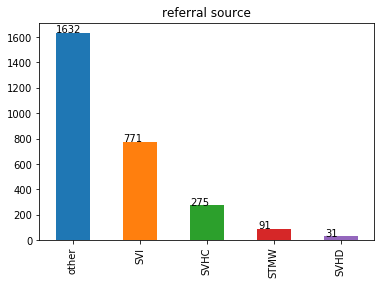

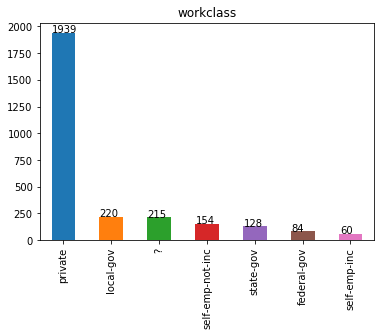

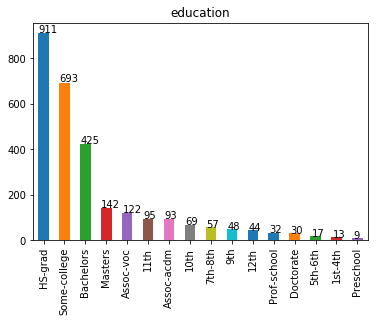

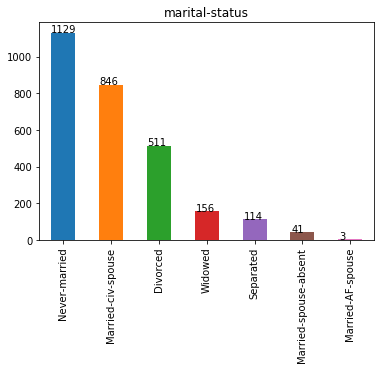

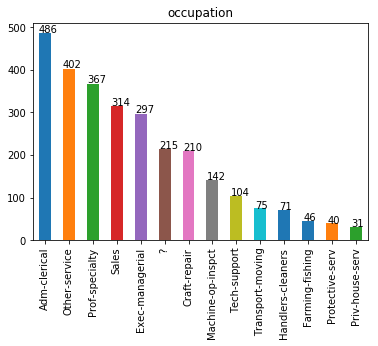

...

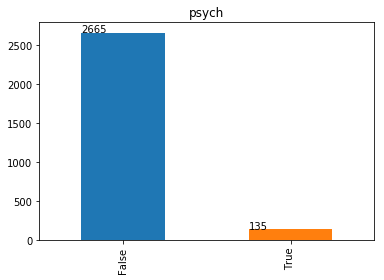

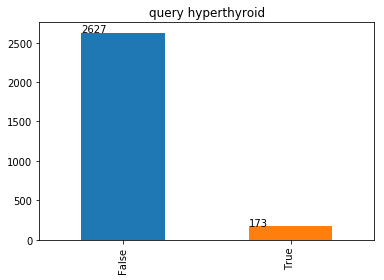

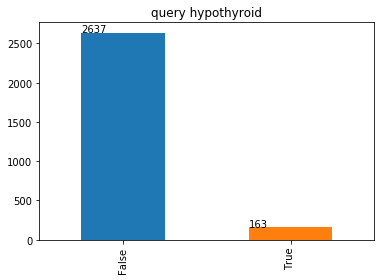

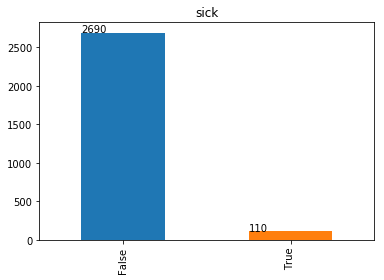

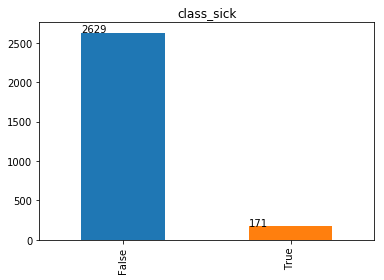

In [51]:
[bar(df[col], title=col) for col in catcols(df)];

Some columns can be generalized

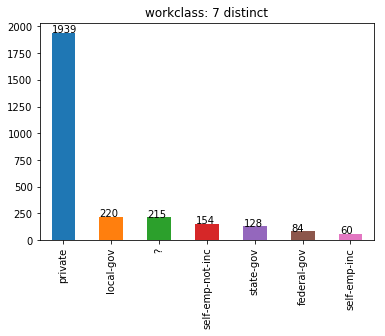

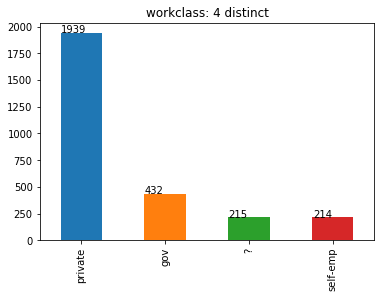

In [52]:
df['workclass_basic'] = df['workclass'].apply(pd.Series)
df['workclass_basic'].replace(regex='.*gov', value='gov', inplace=True)
df['workclass_basic'].replace(regex='self-emp.*', value='self-emp', inplace=True)
for col in ['workclass','workclass_basic']:
    bar(df[col], title='workclass: {} distinct'.format(df[col].nunique()))

The problem is that in this case similar values do not necessarily imply the same disease risk, or even worse there are not enough value counts to find it out

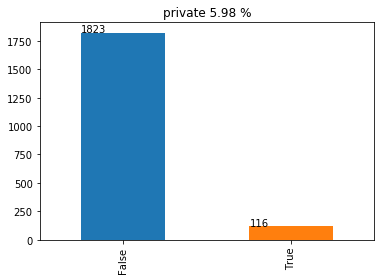

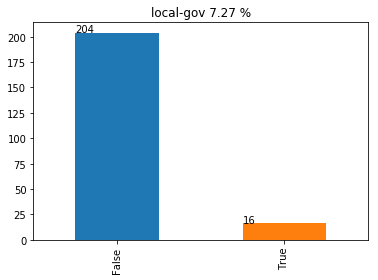

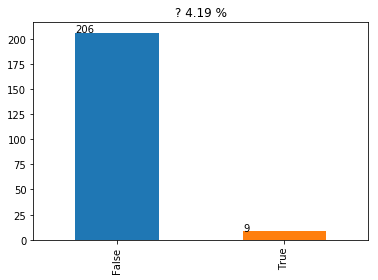

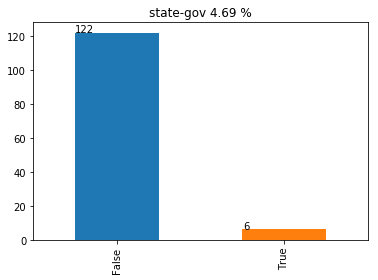

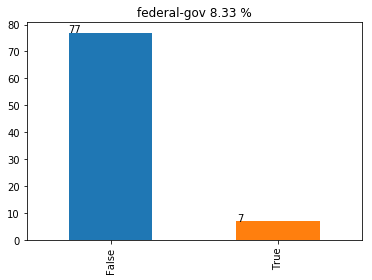

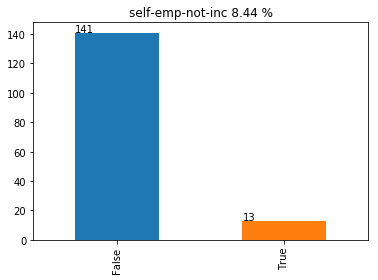

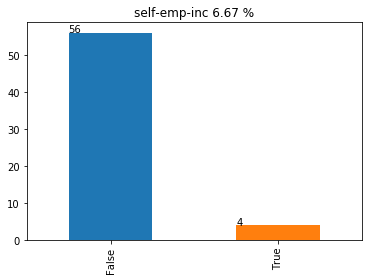

In [53]:
for v in df['workclass'].unique():
    temp = df[df['workclass']==v]
    bar(temp['class_sick'], title='{} {}'.format(v, percent(len(temp[temp['class_sick']==True]) / len(temp))))

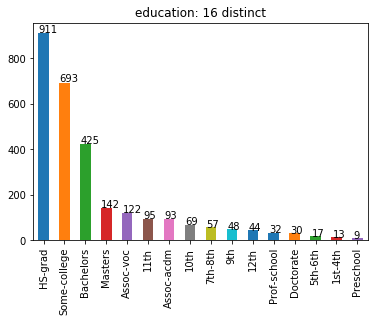

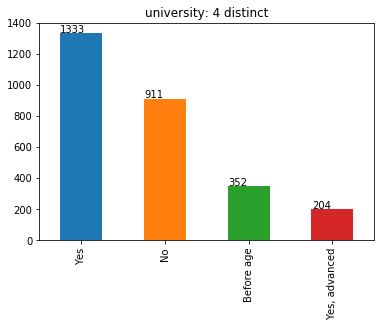

In [54]:
df['university'] = df['education'].apply(lambda x: x.lower()).apply(pd.Series)

df['university'].replace(to_replace='preschool', value='Before age', inplace=True)
df['university'].replace(regex='.*th', value='Before age', inplace=True)

df['university'].replace(to_replace='hs-grad', value='No', inplace=True)

df['university'].replace(to_replace=['some-college','bachelors'], value='Yes', inplace=True)
df['university'].replace(regex='assoc.*', value='Yes', inplace=True)

df['university'].replace(to_replace=['masters','doctorate'], value='Yes, advanced', inplace=True)
df['university'].replace(regex='prof.*', value='Yes, advanced', inplace=True)

for col in ['education','university']:
    bar(df[col], title='{}: {} distinct'.format(col, df[col].nunique()))

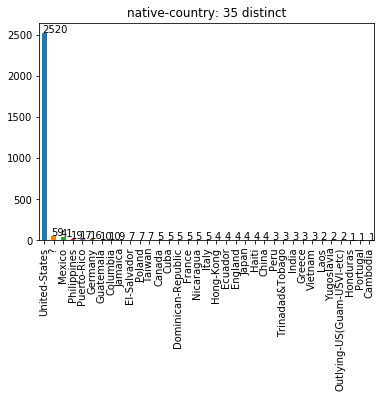

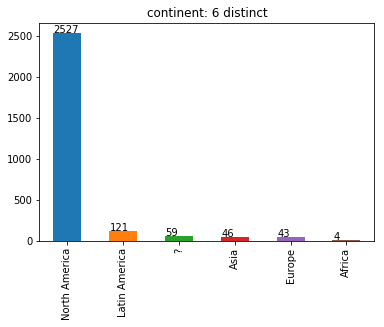

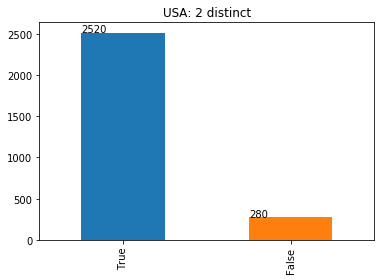

In [55]:
df['native-country'].replace(to_replace='South', value='?', inplace=True)
df['native-country'].replace(to_replace='Hong', value='Hong-Kong', inplace=True)

df['continent'] = df['native-country'].apply(pd.Series)

continents = {}
continents.update(dict.fromkeys(['United-States','Canada','Outlying-US(Guam-USVI-etc)'],\
                                'North America'))
continents.update(dict.fromkeys(['Mexico','Puerto-Rico','Guatemala','Columbia','Jamaica','El-Salvador',\
                                 'Nicaragua','Cuba','Dominican-Republic','Haiti','Ecuador','Peru','Honduras'],\
                                'Latin America'))
continents.update(dict.fromkeys(['Germany','Poland','Italy','France','England','Greece','Yugoslavia','Portugal'],\
                                'Europe'))
continents.update(dict.fromkeys(['Trinadad&Tobago','Cambodia'],\
                                'Africa'))
continents.update(dict.fromkeys(['Philippines','Taiwan','China','Hong-Kong','Japan','India','Vietnam','Laos'],\
                                'Asia'))
##########
continents.update(dict.fromkeys(['Scotland','Ireland'],'Europe'))
continents.update(dict.fromkeys(['Iran'],'Asia'))
##########

df['continent'] = df['continent'].apply(lambda x: continents[x] if x in continents.keys() and x!='?' else x)

df['USA'] = df['native-country']=='United-States'

for col in ['native-country','continent','USA']:
    bar(df[col], title='{}: {} distinct'.format(col, df[col].nunique()))

In [56]:
display(df[catcols(df)].describe())

,referral source,workclass,education,marital-status,occupation,relationship,race,native-country,sex,workclass_basic,university,continent,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,T3 measured,FTI measured,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sick,class_sick,USA
count,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800,2800
unique,5,7,16,7,14,6,5,35,3,4,4,6,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2
top,other,private,HS-grad,Never-married,Adm-clerical,Not-in-family,White,United-States,female,private,Yes,North America,False,False,False,False,False,False,False,False,False,True,True,True,True,True,False,False,False,False,False,False,True
freq,1632,1939,911,1129,486,893,2316,2520,1830,1939,1333,2527,2470,2760,2759,2761,2752,2786,2775,2729,2799,2215,2535,2503,2516,2616,2766,2665,2627,2637,2690,2629,2520


### Numeric

In [57]:
display(df[numcols(df)].describe(percentiles=[.001,.005,.01,.05,0.1,.25,.5,.75,.9,.95,.99,.995,.999]))

,age,TSH,T3,TT4,T4U,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,FTI,class_num,year,month,day
count,2799.00000,2516.000000,2215.000000,2616.000000,2503.000000,2.800000e+03,2520.000000,2800.00000,2800.000000,2800.000000,2505.000000,2800.000000,2799.000000,2799.000000,2799.000000
mean,51.84423,4.672150,2.024966,109.072401,0.997912,1.899808e+05,12.574206,704.51500,74.742500,38.241429,110.787984,1895.603214,1965.228653,6.546981,15.724544
std,20.46116,21.449453,0.824600,35.392443,0.194390,1.063113e+05,325.588773,5946.84496,371.736424,12.248277,32.883986,1091.130220,20.509971,3.433092,8.759119
min,1.00000,0.005000,0.050000,2.000000,0.310000,1.939500e+04,-1600.000000,0.00000,0.000000,1.000000,2.000000,1.000000,1563.000000,1.000000,1.000000
0.1%,1.00000,0.005000,0.100000,5.415000,0.445140,1.991400e+04,-1500.000000,0.00000,0.000000,2.000000,6.206400,3.799000,1907.384000,1.000000,1.000000
0.5%,7.00000,0.005000,0.200000,13.000000,0.550200,2.471932e+04,-1300.000000,0.00000,0.000000,4.000000,11.000000,14.995000,1927.000000,1.000000,1.000000
1%,13.00000,0.005000,0.300000,23.600000,0.600200,2.746566e+04,-1300.000000,0.00000,0.000000,7.990000,29.120000,34.990000,1930.000000,1.000000,1.000000
5%,20.00000,0.025000,0.800000,63.000000,0.740000,4.537775e+04,1.000000,0.00000,0.000000,15.000000,70.000000,187.900000,1938.000000,1.000000,2.000000
10%,25.00000,0.080000,1.200000,73.000000,0.790000,6.883530e+04,6.000000,0.00000,0.000000,20.000000,79.000000,366.900000,1942.000000,2.000000,4.000000
25%,36.00000,0.440000,1.600000,88.000000,0.880000,1.187620e+05,9.000000,0.00000,0.000000,35.000000,93.000000,955.750000,1950.000000,4.000000,8.000000


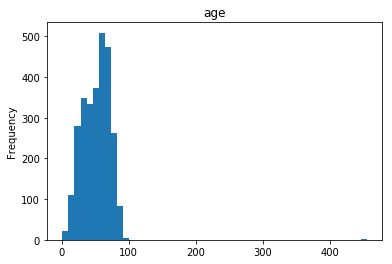

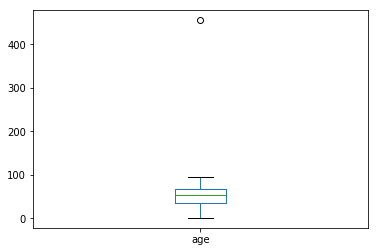

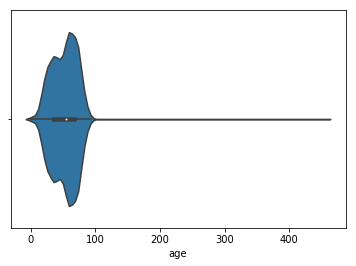

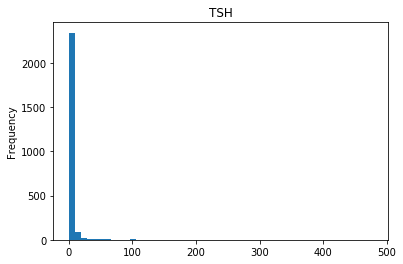

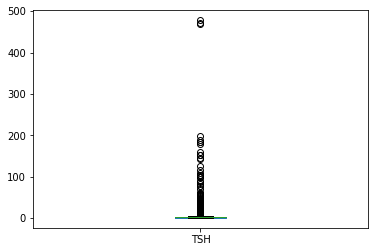

...

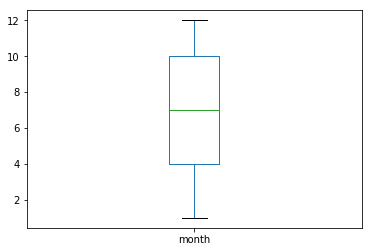

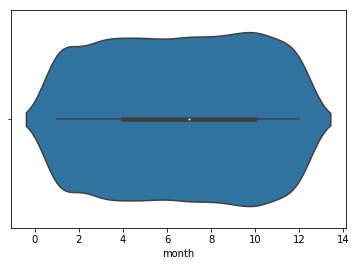

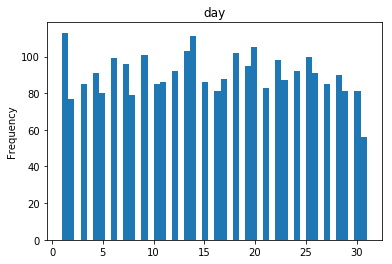

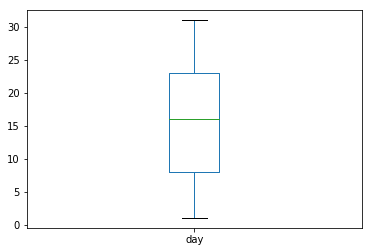

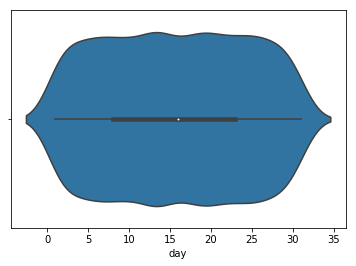

In [58]:
[contplot(df[col], bins=50) for col in numcols(df)];

### Outliers

We saw different types of outliers, that is why we choose different strategies:
- *values against common sense:* such values can be labelled as unknown without information loss
- *marginal values:* significantly different but despite possibly real, non-standard individuals, on those outlier substitution techniques can be applied

,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,referral source,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick,class_sick,class_num,year,month,day,workclass_basic,university,continent,USA
566,NaN,False,False,False,False,False,False,False,False,False,1.1,True,2.0,118.0,1.13,True,SVI,private,130834.0,Some-college,10.0,Never-married,Adm-clerical,Not-in-family,White,0.0,0.0,40.0,United-States,104.0,True,True,True,False,False,False,False,female,False,False,861.0,1563.0,3.0,29.0,private,Yes,North America,True
2588,NaN,True,False,False,False,True,False,False,False,False,0.6,True,1.5,120.0,0.82,True,other,private,60374.0,HS-grad,NaN,Widowed,Craft-repair,Unmarried,White,0.0,1594.0,26.0,United-States,146.0,True,True,True,False,False,False,False,female,False,False,1.0,NaN,NaN,NaN,private,No,North America,True


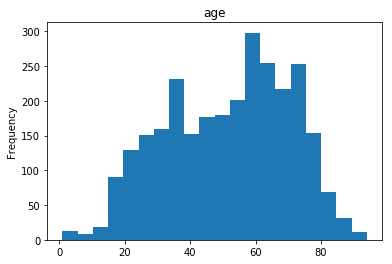

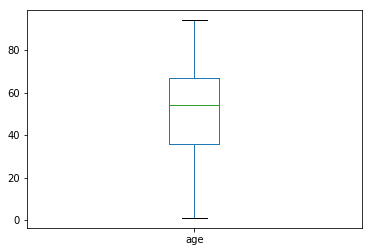

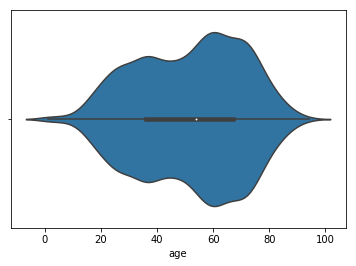

In [59]:
ACCEPTED_AGE_CEIL = 120
df['age'] = df['age'].apply(lambda x: np.nan if x>ACCEPTED_AGE_CEIL or pd.isnull(x) else x)
display(df[pd.isnull(df['age'])])
contplot(df['age'])

Before removal of (seemingly) measurement instrument's mistake, it is still good to make sure it does not represent an extremely sick patient

,TSH,class_sick
507,472.0,False
1933,468.0,False
2264,478.0,False


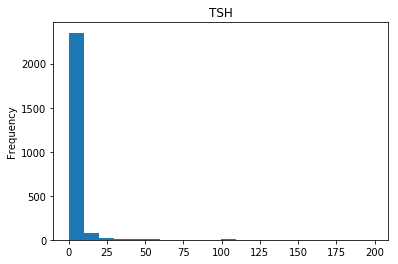

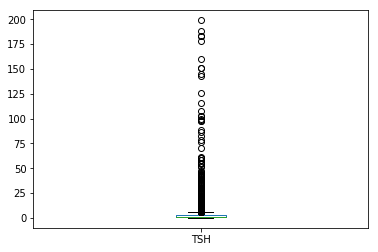

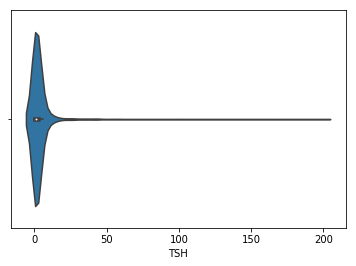

In [60]:
# https://www.healthline.com/health/tsh
ACCEPTED_TSH_CEIL = 300
display(df[df['TSH']>ACCEPTED_TSH_CEIL][['TSH','class_sick']])
df['TSH'] = df['TSH'].apply(lambda x: np.nan if x>ACCEPTED_TSH_CEIL else x)
contplot(df['TSH'])

Transform exponentially decreasing *TSH* by logarithm

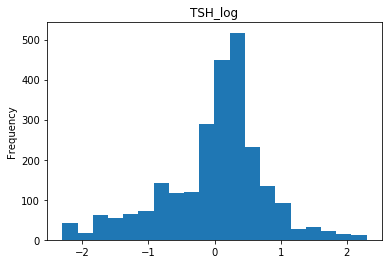

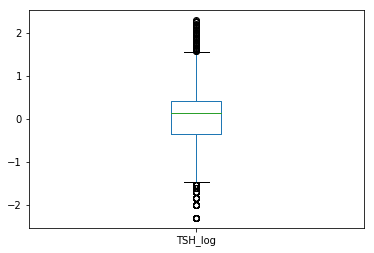

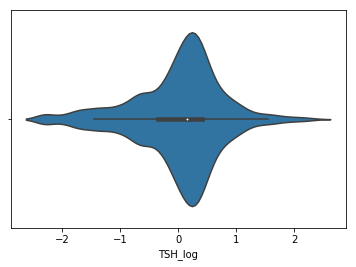

In [61]:
df['TSH_log'] = df['TSH'].apply(lambda x: x if pd.isnull(x) else np.log10(x))
contplot(df['TSH_log'])

,T3,class_sick
2145,10.6,False


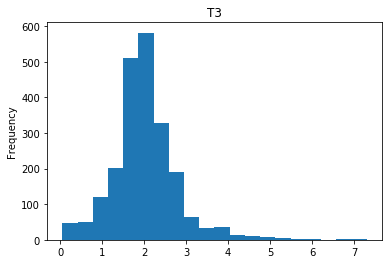

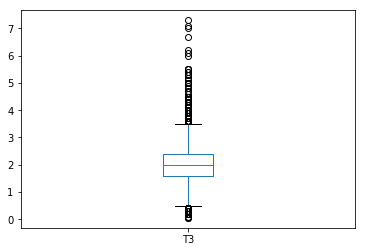

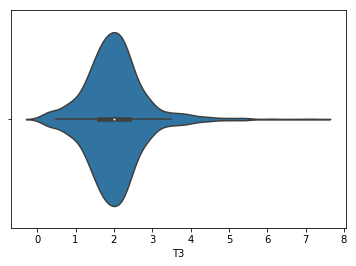

In [62]:
# https://www.healthline.com/health/t3
ACCEPTED_T3_CEIL = 8
display(df[df['T3']>ACCEPTED_T3_CEIL][['T3','class_sick']])
df['T3'] = df['T3'].apply(lambda x: np.nan if x>ACCEPTED_T3_CEIL else x)
contplot(df['T3'])

,TT4,class_sick
77,430.0,False
2635,430.0,False


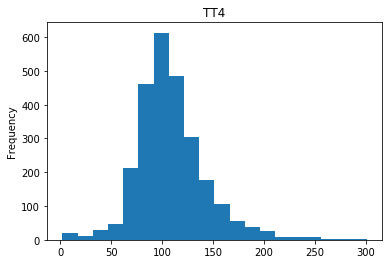

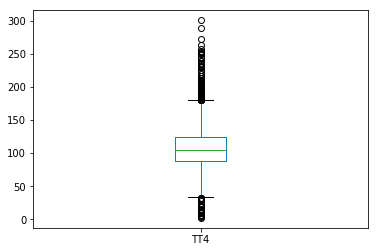

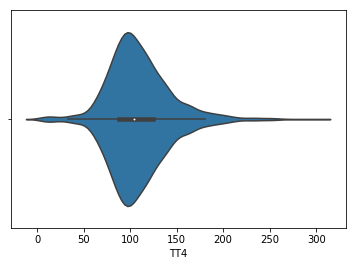

In [63]:
# https://www.healthline.com/health/t4
# TT4 = total T4
# T4U = ???
ACCEPTED_TT4_CEIL = 350
display(df[df['TT4']>ACCEPTED_TT4_CEIL][['TT4','class_sick']])
df['TT4'] = df['TT4'].apply(lambda x: np.nan if x>ACCEPTED_TT4_CEIL else x)
contplot(df['TT4'])

For some numeric columns (... measured in particular), a new boolean column could be generated based on increased/decreased value detected in individual's body (ideally with treshold estimated by a specialist). However, in this case few similar conclusion have already been made, see hyper- and hypothyroid etc.

*fnlwgt*, i.e. sample weight tells what proportion of population the sampled individual represents

In [64]:
df.rename(columns={'fnlwgt': 'sample-weight'}, copy=False, inplace=True)

,capital-gain,class_sick
556,99999.0,False
702,99999.0,False
738,99999.0,False
879,99999.0,False
1465,99999.0,False
1962,99999.0,False
2170,99999.0,False
2184,99999.0,False
2258,99999.0,False


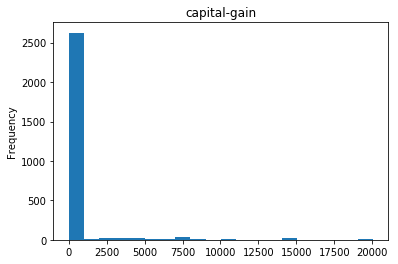

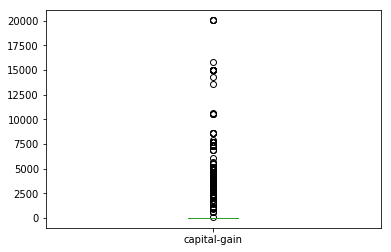

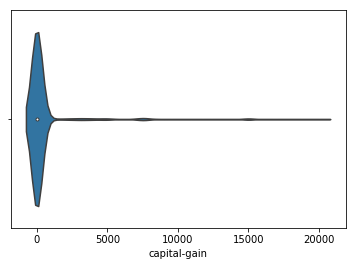

In [65]:
display(df[df['capital-gain']>30000][['capital-gain','class_sick']])
df['capital-gain'] = df['capital-gain'].apply(lambda x: np.nan if x==99999.0 else x)
contplot(df['capital-gain'])

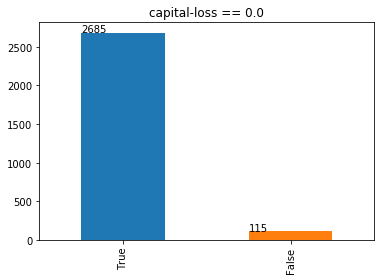

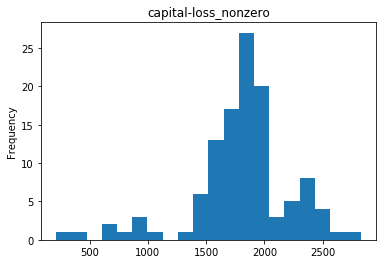

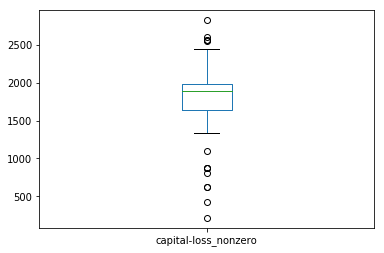

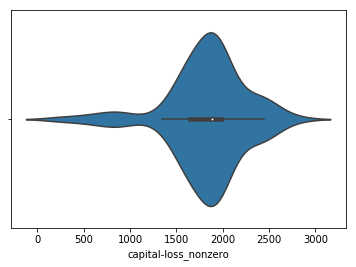

In [66]:
df['capital-loss_iszero'] = df['capital-loss'].apply(lambda x: '?' if pd.isnull(x) else x==0.0).apply(pd.Series)
bar(df['capital-loss_iszero'], title='capital-loss == 0.0')
df['capital-loss_nonzero'] = df['capital-loss'].apply(lambda x: np.nan if pd.isnull(x) or x==0.0 else x).apply(pd.Series)
contplot(df['capital-loss_nonzero'])

,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,referral source,workclass,sample-weight,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick,class_sick,class_num,year,month,day,workclass_basic,university,continent,USA,TSH_log,capital-loss_iszero,capital-loss_nonzero
566,NaN,False,False,False,False,False,False,False,False,False,1.1,True,2.0,118.0,1.13,True,SVI,private,130834.0,Some-college,10.0,Never-married,Adm-clerical,Not-in-family,White,0.0,0.0,40.0,United-States,104.0,True,True,True,False,False,False,False,female,False,False,861.0,NaN,3.0,29.0,private,Yes,North America,True,0.041393,True,NaN
2588,NaN,True,False,False,False,True,False,False,False,False,0.6,True,1.5,120.0,0.82,True,other,private,60374.0,HS-grad,NaN,Widowed,Craft-repair,Unmarried,White,0.0,1594.0,26.0,United-States,146.0,True,True,True,False,False,False,False,female,False,False,1.0,NaN,NaN,NaN,private,No,North America,True,-0.221849,False,1594.0


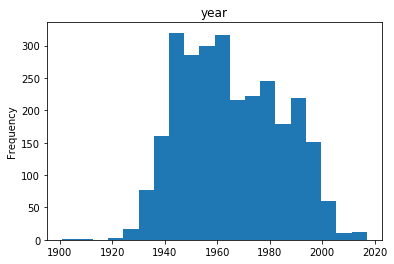

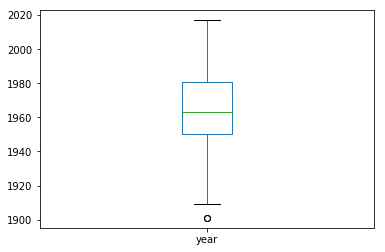

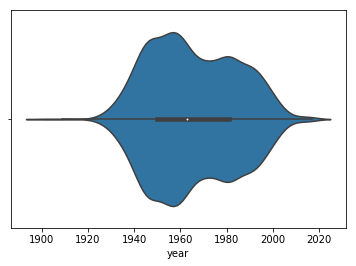

,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,referral source,workclass,sample-weight,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick,class_sick,class_num,year,month,day,workclass_basic,university,continent,USA,TSH_log,capital-loss_iszero,capital-loss_nonzero
566,NaN,False,False,False,False,False,False,False,False,False,1.1,True,2.0,118.0,1.13,True,SVI,private,130834.0,Some-college,10.0,Never-married,Adm-clerical,Not-in-family,White,0.0,0.0,40.0,United-States,104.0,True,True,True,False,False,False,False,female,False,False,861.0,NaN,3.0,29.0,private,Yes,North America,True,0.041393,True,NaN
2588,NaN,True,False,False,False,True,False,False,False,False,0.6,True,1.5,120.0,0.82,True,other,private,60374.0,HS-grad,NaN,Widowed,Craft-repair,Unmarried,White,0.0,1594.0,26.0,United-States,146.0,True,True,True,False,False,False,False,female,False,False,1.0,NaN,NaN,NaN,private,No,North America,True,-0.221849,False,1594.0


In [67]:
ACCEPTED_YEAR_FLOOR = 1880
df['year'] = df['year'].apply(lambda x: np.nan if x<ACCEPTED_YEAR_FLOOR or pd.isnull(x) else x)
display(df[pd.isnull(df['year'])])
contplot(df['year'])
display(df[pd.isnull(df['age'])])

### Missing values

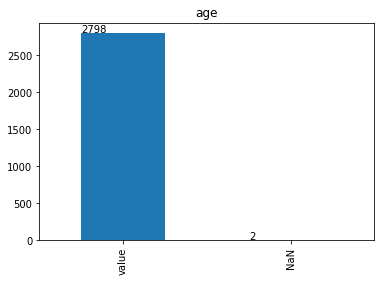

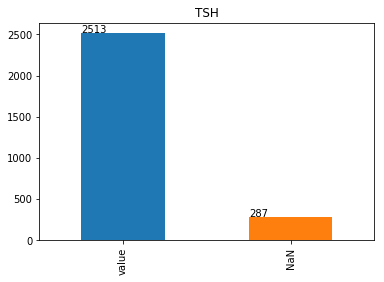

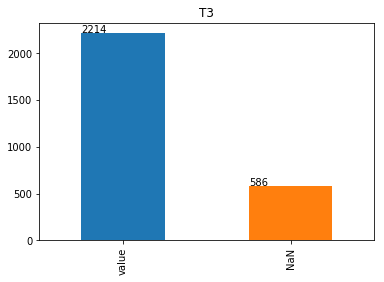

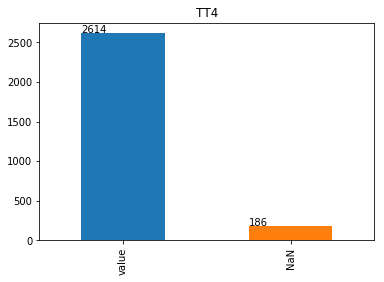

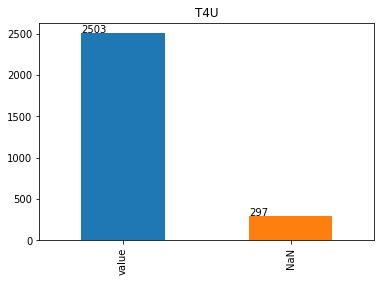

...

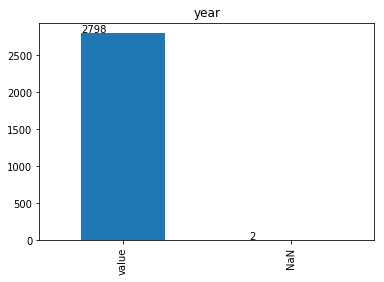

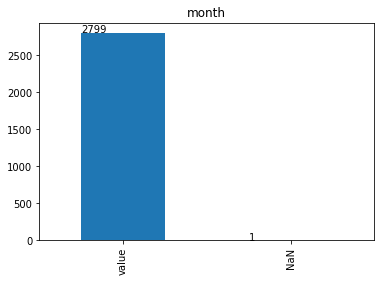

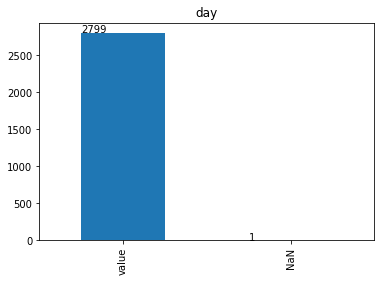

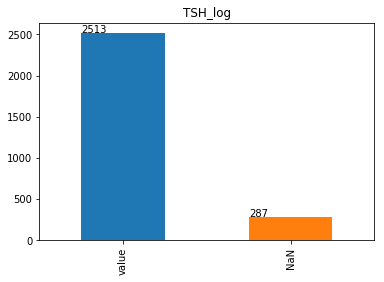

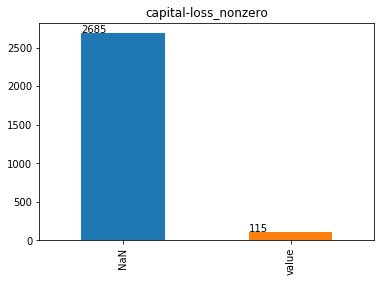

In [68]:
[bar(df[col].apply(lambda x: 'NaN' if pd.isnull(x) else 'value'), title=col) for col in numcols(df)];

Creating new column has been unfortunately a fail, due to too little known values

In [69]:
df.drop(['capital-loss_nonzero'], axis=1, inplace=True)

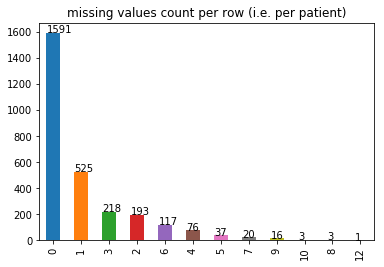

In [70]:
bar(df.applymap(lambda x: np.nan if type(x)==str and x=='?' else x).isnull().sum(axis=1), title='missing values count per row (i.e. per patient)')

### Bivariate analysis

Scatter all pairs of variables, differentiate between <span style="color:red"><b>sick</b></span> and <span style="color:blue"><b>negative</b></span> patients.

Some variables (with exponential-like distribution in particular) can be beter explored after logarithmic-like transformation applied

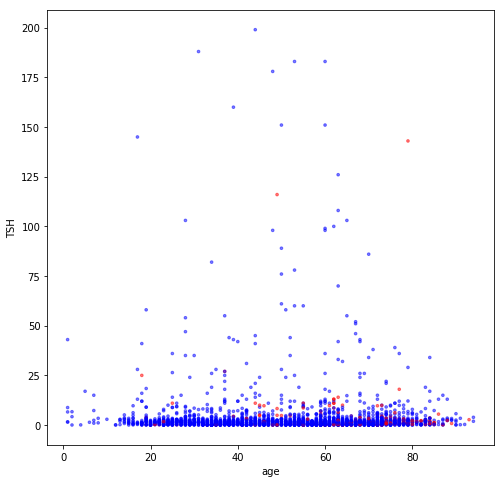

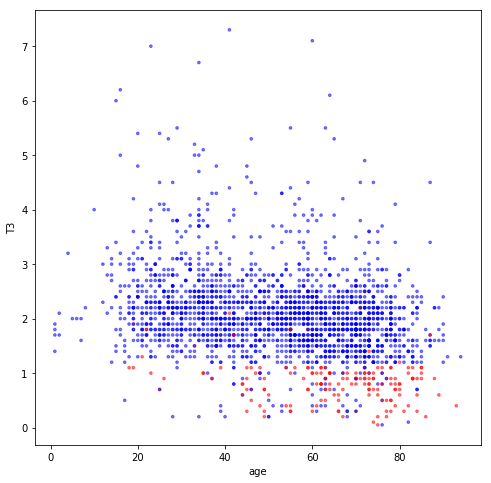

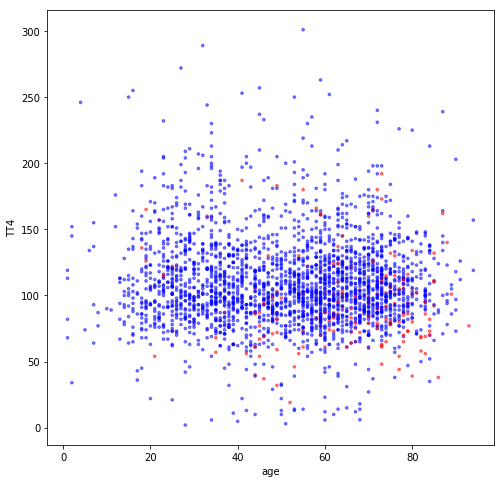

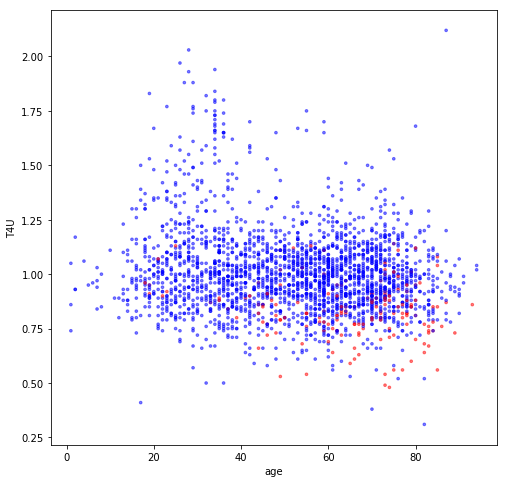

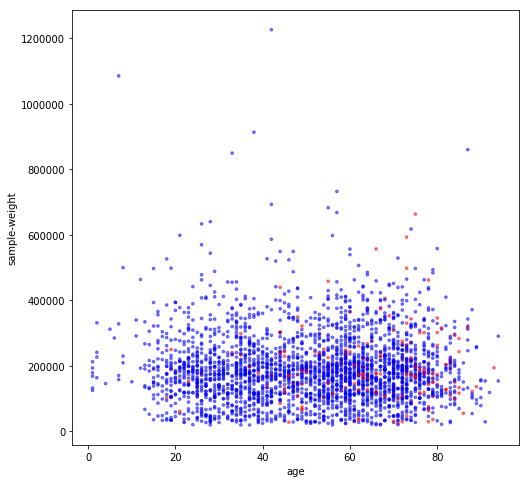

...

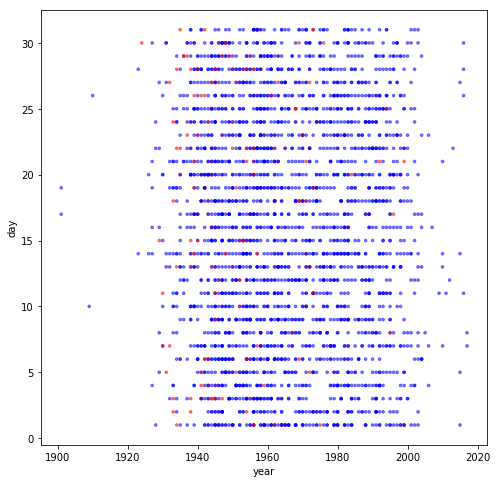

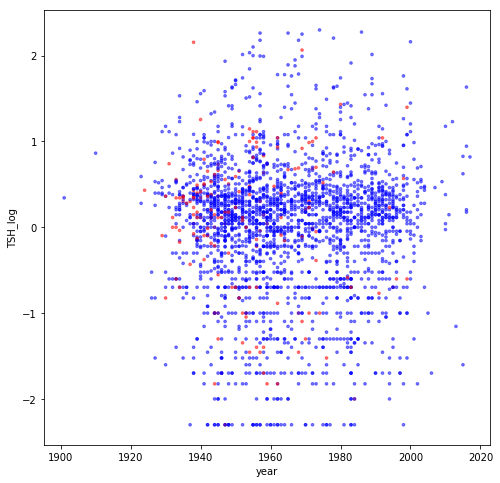

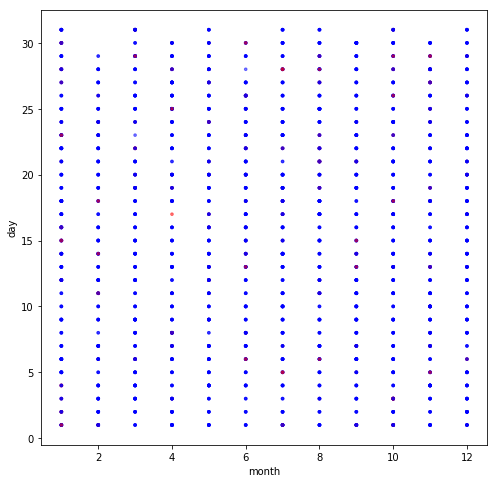

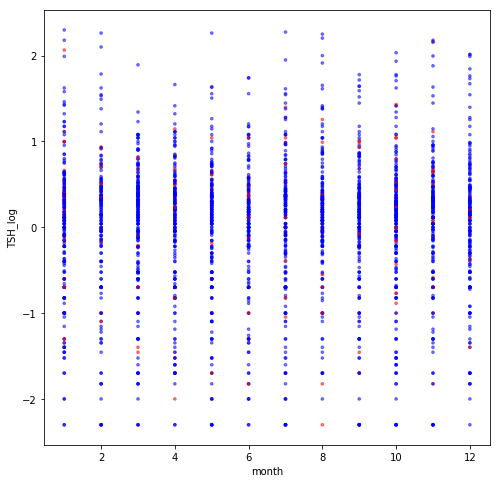

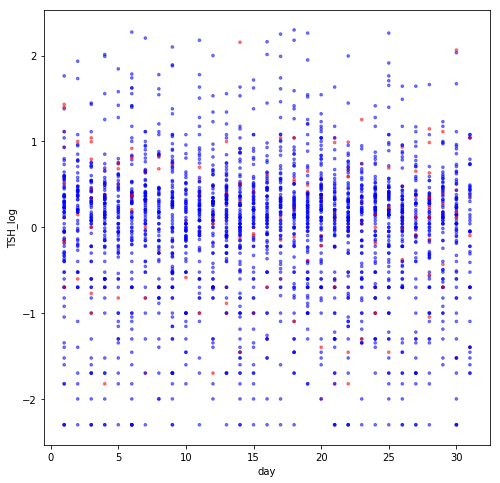

In [71]:
bool_color = df['class_sick'].apply(lambda x: 'red' if x else 'blue')
[scatter(df[colx], df[coly], color_series=bool_color) for colx,coly in itertools.combinations(numcols(df), r=2)];

Correct observed *age*-*year* nonsense

In [72]:
print((df['year'] + df['age']).unique())

[2017. 2018. 1917.   nan]


In [73]:
nonsense_age = df[(df['year'] + df['age']).apply(lambda x: x not in [2017,2018])][['age','year']]
display(nonsense_age)

,age,year
440,7.0,1910.0
549,16.0,1901.0
566,NaN,NaN
1244,16.0,1901.0
2051,8.0,1909.0
2588,NaN,NaN


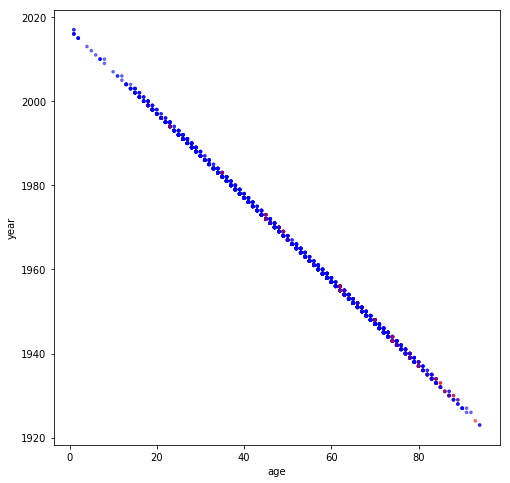

In [74]:
df.loc[nonsense_age.index,'year'] = np.nan
scatter(df['age'], df['year'], color_series=bool_color)

We can see *age* & *year* represent the same information.
Also, day & month seem improbable to be disease decoupled (in case we observed sick patients associated with a specific day or month on scatter plot we would consider to keep them)

In [75]:
df.drop(['day','month','year'], axis=1, inplace=True)

Confirm correlation *FTI*-*TT4* by all relevant coefficients

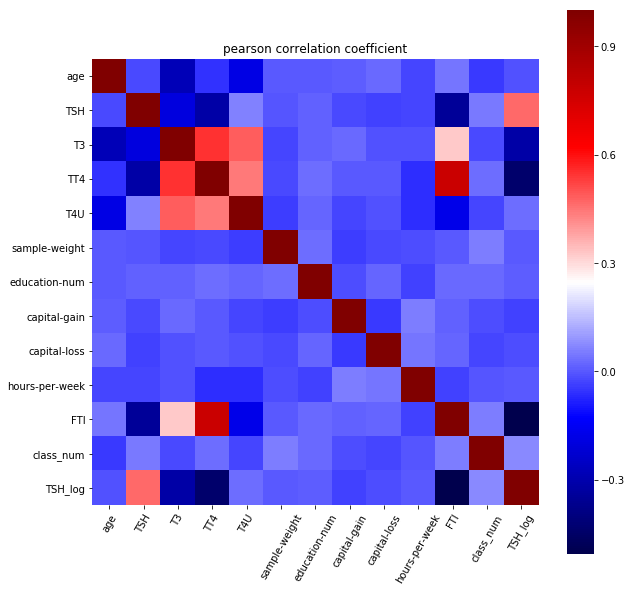

,age,TSH,T3,TT4,T4U,sample-weight,education-num,capital-gain,capital-loss,hours-per-week,FTI,class_num,TSH_log
age,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TSH,NaN,1.000000,NaN,-0.312678,NaN,NaN,NaN,NaN,NaN,NaN,-0.345117,NaN,0.470382
T3,NaN,NaN,1.000000,0.552191,0.485111,NaN,NaN,NaN,NaN,NaN,0.327446,NaN,-0.313802
TT4,NaN,-0.312678,0.552191,1.000000,0.445654,NaN,NaN,NaN,NaN,NaN,0.781631,NaN,-0.434643
T4U,NaN,NaN,0.485111,0.445654,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sample-weight,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education-num,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
capital-gain,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
capital-loss,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
hours-per-week,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN


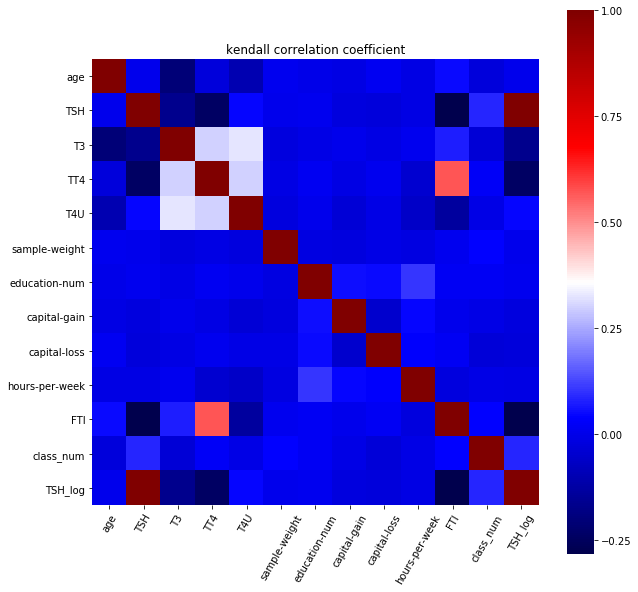

,age,TSH,T3,TT4,T4U,sample-weight,education-num,capital-gain,capital-loss,hours-per-week,FTI,class_num,TSH_log
age,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TSH,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
T3,NaN,NaN,1.000000,0.302814,0.328241,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TT4,NaN,NaN,0.302814,1.000000,0.302329,NaN,NaN,NaN,NaN,NaN,0.572849,NaN,NaN
T4U,NaN,NaN,0.328241,0.302329,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sample-weight,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education-num,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
capital-gain,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
capital-loss,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
hours-per-week,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN


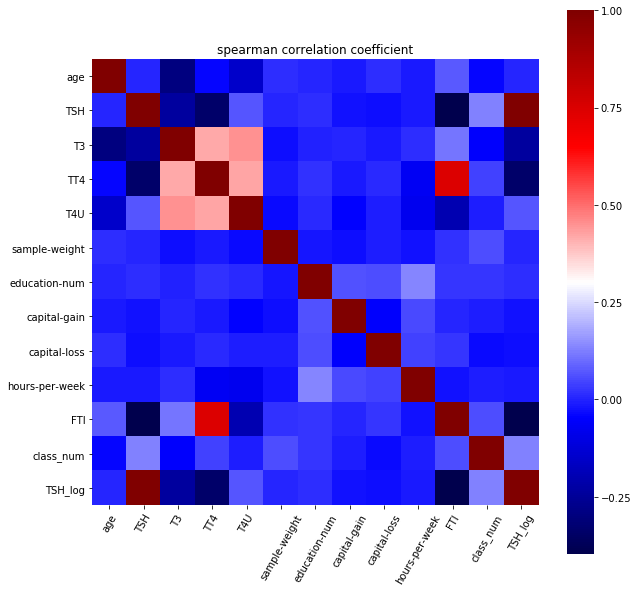

,age,TSH,T3,TT4,T4U,sample-weight,education-num,capital-gain,capital-loss,hours-per-week,FTI,class_num,TSH_log
age,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TSH,NaN,1.000000,NaN,-0.339392,NaN,NaN,NaN,NaN,NaN,NaN,-0.396854,NaN,1.000000
T3,NaN,NaN,1.000000,0.421501,0.449832,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TT4,NaN,-0.339392,0.421501,1.000000,0.422789,NaN,NaN,NaN,NaN,NaN,0.745014,NaN,-0.339392
T4U,NaN,NaN,0.449832,0.422789,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sample-weight,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education-num,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
capital-gain,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
capital-loss,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
hours-per-week,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN


In [76]:
for method in ['pearson','kendall','spearman']:
    corr_num = df[numcols(df)].corr(method)
    hm(corr_num, xlabels=corr_num.columns, ylabels=corr_num.columns, title='{} correlation coefficient'.format(method))
    display(corr_num[corr_num.applymap(lambda x: np.absolute(x) > .3)])

We did not observe any apparent correlation apart from mentioned one

We have noticed that *education-num* depends directly on *education* (it is discrete not continuous), some malformed occurences exist though

In [77]:
display(df[['education','education-num']].drop_duplicates())

,education,education-num
0,HS-grad,9.0
1,Some-college,10.0
2,Masters,14.0
3,7th-8th,4.0
5,Assoc-voc,11.0
7,Bachelors,13.0
8,9th,5.0
9,Assoc-voc,-1100.0
11,10th,NaN
16,Assoc-acdm,12.0


Indentify concrete 1:1 relationship between education columns

In [78]:
for edu_cat in df['education'].unique():
    print(edu_cat)
    print(df[df['education']==edu_cat]['education-num'].unique())

HS-grad
[   9.  900. -900.   nan]
Some-college
[   10.    nan -1000.  1000.]
Masters
[   14.    nan -1400.  1400.]
7th-8th
[   4.   nan -400.  400.]
Assoc-voc
[   11. -1100.    nan  1100.]
Bachelors
[   13.    nan  1300. -1300.]
9th
[   5.  500.   nan -500.]
10th
[  nan    6. -600.  600.]
Assoc-acdm
[   12.    nan  1200. -1200.]
Doctorate
[   16.    nan -1600.]
12th
[   8.   nan -800.  800.]
Preschool
[   1.   nan -100.]
1st-4th
[200.   2.  nan]
11th
[   7.   nan  700. -700.]
5th-6th
[   3.  300.   nan -300.]
Prof-school
[   15. -1500.  1500.]


In [79]:
def education_to_num(edu_cat):
    return {
        'Preschool': 1.,
        '1st-4th': 2.,
        '5th-6th': 3.,
        '7th-8th': 4.,
        '9th': 5.,
        '10th': 6.,
        '11th': 7.,
        '12th': 8.,
        'HS-grad': 9.,
        'Some-college': 10.,
        'Assoc-voc': 11.,
        'Assoc-acdm': 12.,
        'Bachelors': 13.,
        'Masters': 14.,
        'Prof-school': 15.,
        'Doctorate': 16.
    }.get(edu_cat, np.nan) # unexpected to reach default   

The advantage of numeric over categoric form is that it defines range, hence we do not proceed with column dropping, but changing (correcting) numeric series based on categoric. Great is that *education* contains no unknown (NaN) values

In [80]:
df['education-num'] = df['education'].apply(lambda x: education_to_num(x))
display(df[['education','education-num']].drop_duplicates())
df.drop(['education'], axis=1, inplace=True)

,education,education-num
0,HS-grad,9.0
1,Some-college,10.0
2,Masters,14.0
3,7th-8th,4.0
5,Assoc-voc,11.0
7,Bachelors,13.0
8,9th,5.0
11,10th,6.0
16,Assoc-acdm,12.0
24,Doctorate,16.0


Outcomes (from scatter) with focus on predicted variable:
- low *T3* levels definitely belong to disease endangered group
- low *T4U* levels probably belong to disease endangered group
- disease risk grows with *age*
- *FTI* correlates with *TT4*. Interesting observation here is that sick patients have ratio FTI/TT4 > approx. 1
- *class_num* is uniformly distributed, probably an index

### Distribution

Compare quantiles with normal distribution

D:\Users\Pc\Miniconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
D:\Users\Pc\Miniconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
D:\Users\Pc\Miniconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1821: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


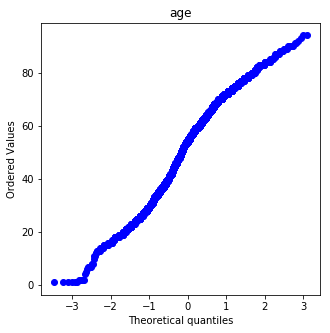

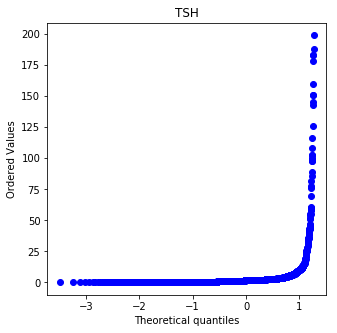

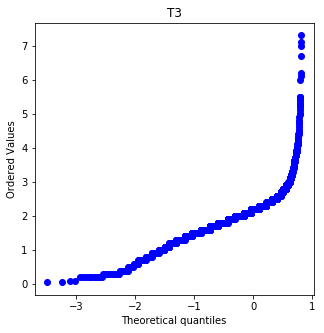

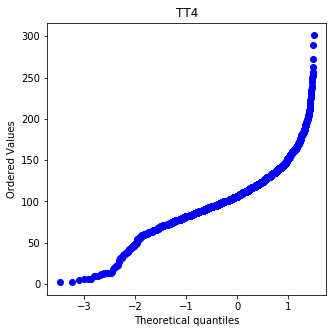

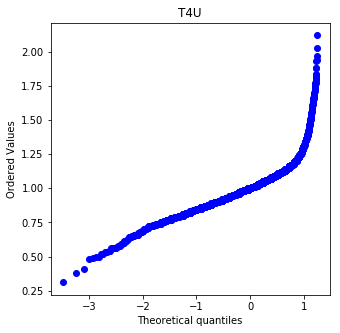

...

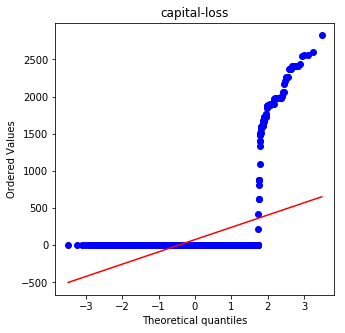

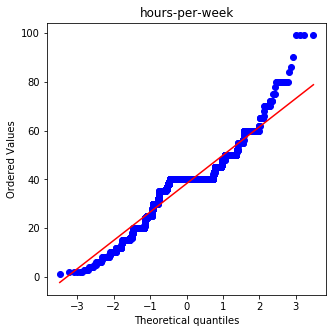

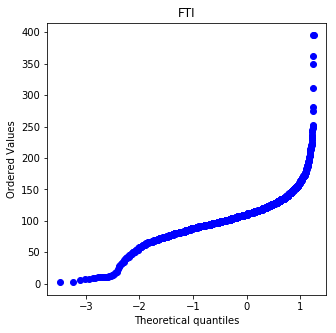

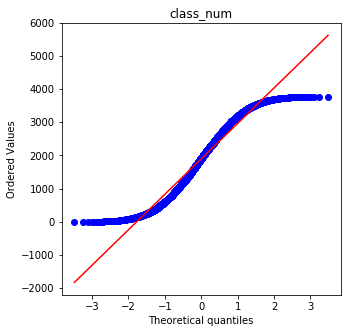

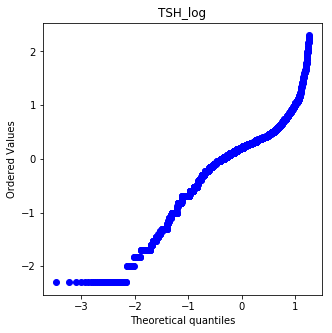

In [81]:
[qqplot(df[col], title=col) for col in numcols(df)];

Hereby we have confirmed visually correctness of logarithm-like transformation on *TSH*

In [82]:
df.drop(['TSH'], axis=1, inplace=True)
# keep log transformed only

### Relationship to predicted variable

In [83]:
# for each attribute
for col in catcols(df):
    print(col)
    # for each unique value
    for v in df[col].unique():
        # suppose this value (and NO another value) predicts True for sick patient), evaluate
        print('\t', v, len(df[df[col] == v]))
#         tp = len(df[(df[col] == v) & (df['class_sick'] == True)])
#         fp = len(df[(df[col] == v) & (df['class_sick'] != True)])
#         fn = len(df[(df[col] != v) & (df['class_sick'] == True)])
        y_col = df[col].apply(lambda x: x==v)
        # accuracy = (tp + tn) / total 
        print(2*'\t', 'accuracy ', percent(metrics.accuracy_score(y_true=df['class_sick'], y_pred=y_col)))
        print(2*'\t', ' weighted', percent(metrics.accuracy_score(y_true=df['class_sick'], y_pred=y_col, sample_weight=df['sample-weight'])))
        # precision = tp / (tp + fp)
        print(2*'\t', 'precision', percent(metrics.precision_score(y_true=df['class_sick'], y_pred=y_col)))
        print(2*'\t', ' weighted', percent(metrics.precision_score(y_true=df['class_sick'], y_pred=y_col, sample_weight=df['sample-weight'])))
        # recall = tp / (tp + fn)
        print(2*'\t', 'recall   ', percent(metrics.recall_score(y_true=df['class_sick'], y_pred=y_col)))
        print(2*'\t', ' weighted', percent(metrics.recall_score(y_true=df['class_sick'], y_pred=y_col, sample_weight=df['sample-weight'])))
        # f1score = 2 / (1/precision + 1/recall)
        print(2*'\t', 'F1 score ', percent(metrics.f1_score(y_true=df['class_sick'], y_pred=y_col)))
        print(2*'\t', ' weighted', percent(metrics.f1_score(y_true=df['class_sick'], y_pred=y_col, sample_weight=df['sample-weight'])))

referral source
	 SVI 771
		 accuracy  76.21 %
		  weighted 76.16 %
		 precision 17.9 %
		  weighted 18.59 %
		 recall    80.7 %
		  weighted 82.93 %
		 F1 score  29.3 %
		  weighted 30.37 %
	 other 1632
		 accuracy  37.39 %
		  weighted 37.3 %
		 precision 1.53 %
		  weighted 1.33 %
		 recall    14.62 %
		  weighted 12.3 %
		 F1 score  2.77 %
		  weighted 2.4 %
	 SVHC 275
		 accuracy  84.43 %
		  weighted 84.11 %
		 precision 1.82 %
		  weighted 1.57 %
		 recall    2.92 %
		  weighted 2.48 %
		 F1 score  2.24 %
		  weighted 1.92 %
	 STMW 91
		 accuracy  90.64 %
		  weighted 90.7 %
		 precision 0.0 %
		  weighted 0.0 %
		 recall    0.0 %
		  weighted 0.0 %
		 F1 score  0.0 %
		  weighted 0.0 %
	 SVHD 31
		 accuracy  93.0 %
		  weighted 92.92 %
		 precision 9.68 %
		  weighted 13.11 %
		 recall    1.75 %
		  weighted 2.3 %
		 F1 score  2.97 %
		  weighted 3.91 %
workclass
	 private 1939
		 accuracy  32.93 %
		  weighted 33.12 %
		 precision 5.98 %
		  weighted 6.15 %
		 recall    67.84 

		  weighted 93.57 %
		 precision 0.0 %
		  weighted 0.0 %
		 recall    0.0 %
		  weighted 0.0 %
		 F1 score  0.0 %
		  weighted 0.0 %
	 Haiti 4
		 accuracy  93.75 %
		  weighted 93.57 %
		 precision 0.0 %
		  weighted 0.0 %
		 recall    0.0 %
		  weighted 0.0 %
		 F1 score  0.0 %
		  weighted 0.0 %
	 England 4
		 accuracy  93.75 %
		  weighted 93.68 %
		 precision 0.0 %
		  weighted 0.0 %
		 recall    0.0 %
		  weighted 0.0 %
		 F1 score  0.0 %
		  weighted 0.0 %
	 Yugoslavia 2
		 accuracy  93.82 %
		  weighted 93.66 %
		 precision 0.0 %
		  weighted 0.0 %
		 recall    0.0 %
		  weighted 0.0 %
		 F1 score  0.0 %
		  weighted 0.0 %
	 El-Salvador 7
		 accuracy  93.64 %
		  weighted 93.41 %
		 precision 0.0 %
		  weighted 0.0 %
		 recall    0.0 %
		  weighted 0.0 %
		 F1 score  0.0 %
		  weighted 0.0 %
	 Guatemala 10
		 accuracy  93.61 %
		  weighted 93.38 %
		 precision 10.0 %
		  weighted 8.66 %
		 recall    0.58 %
		  weighted 0.59 %
		 F1 score  1.1 %
		  weighted 1.1 %
	 France 5
		

		  weighted 6.26 %
		 recall    98.83 %
		  weighted 98.83 %
		 F1 score  11.47 %
		  weighted 11.78 %
	 True 25
		 accuracy  93.14 %
		  weighted 92.85 %
		 precision 8.0 %
		  weighted 7.16 %
		 recall    1.17 %
		  weighted 1.17 %
		 F1 score  2.04 %
		  weighted 2.01 %
tumor
	 False 2729
		 accuracy  8.57 %
		  weighted 8.62 %
		 precision 6.23 %
		  weighted 6.4 %
		 recall    99.42 %
		  weighted 99.68 %
		 F1 score  11.72 %
		  weighted 12.03 %
	 True 71
		 accuracy  91.43 %
		  weighted 91.38 %
		 precision 1.41 %
		  weighted 0.84 %
		 recall    0.58 %
		  weighted 0.32 %
		 F1 score  0.83 %
		  weighted 0.47 %
hypopituitary
	 False 2799
		 accuracy  6.07 %
		  weighted 6.26 %
		 precision 6.07 %
		  weighted 6.26 %
		 recall    99.42 %
		  weighted 99.82 %
		 F1 score  11.45 %
		  weighted 11.78 %
	 True 1
		 accuracy  93.93 %
		  weighted 93.74 %
		 precision 100.0 %
		  weighted 100.0 %
		 recall    0.58 %
		  weighted 0.18 %
		 F1 score  1.16 %
		  weighted 0.37 %
T3 meas

*native-country* contains too little sample per most of countries. Besides, possible occurence of a new country is gonna be a problem for transformers

In [84]:
df.drop(['native-country'], axis=1, inplace=True)

Outcomes with focus on predicted variable:
- 

### Inconsistency

Inconsistencies that have occured with test set:
- column *native-country* contains other countries which makes newly created *continent* useless since we have defined key-value dictionary manually

We fixed it by adding additional countries to train better model, even though it may decrease its robustness

In [85]:
##########
# continents.update(dict.fromkeys(['Scotland','Ireland'],'Europe'))
# continents.update(dict.fromkeys(['Iran'],'Asia'))
##########

### Finish

Some columns are not so relevant since we are to use decision trees for classification

In [86]:
df.drop(['sample-weight'], axis=1, inplace=True)

In [87]:
df.replace(to_replace='?', value=np.nan, inplace=True) # because of Imputer later

Save polished but not preserving all information, some additional information added, missing values & outliers still remain

In [88]:
display(df.head())

,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,T3 measured,T3,TT4,T4U,FTI measured,referral source,workclass,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick,class_sick,class_num,workclass_basic,university,continent,USA,TSH_log,capital-loss_iszero
0,48.0,False,False,False,False,False,False,False,False,False,True,1.8,104.0,1.11,True,SVI,private,9.0,Never-married,Machine-op-inspct,Other-relative,White,0.0,0.0,40.0,94.0,True,True,True,False,False,False,False,female,False,False,637.0,private,No,North America,True,-0.698970,True
1,74.0,False,False,False,False,False,False,False,True,False,True,2.2,108.0,0.85,True,other,private,10.0,Never-married,Other-service,Own-child,White,0.0,0.0,20.0,126.0,True,True,True,False,False,False,False,female,False,False,1235.0,private,Yes,North America,True,-1.602060,True
2,60.0,False,False,False,False,False,False,False,False,False,True,1.4,42.0,1.06,True,other,local-gov,14.0,Divorced,Prof-specialty,Not-in-family,White,0.0,0.0,40.0,39.0,True,True,True,False,False,False,False,female,False,False,2654.0,gov,"Yes, advanced",North America,True,2.178977,True
3,89.0,False,False,False,False,False,False,False,False,False,True,0.6,101.0,0.73,True,SVI,private,4.0,Married-civ-spouse,Machine-op-inspct,Husband,Black,0.0,0.0,48.0,138.0,True,True,True,False,False,False,False,male,False,True,434.0,private,Before age,North America,True,-0.096910,True
4,78.0,False,False,False,False,False,False,False,False,False,True,1.8,103.0,0.98,True,SVI,private,9.0,Never-married,Other-service,Not-in-family,White,0.0,0.0,40.0,105.0,True,True,True,False,True,False,False,female,False,False,2964.0,private,No,North America,True,-0.050610,True


In [89]:
save_csv(df, FILE_PATH_POLISHED.format(file_name_base))

Save data to ./train_polished.csv


Cells **above** were saved as **thyroid_preprocess.py**

In [90]:
df = None

Do the same preprocess for test set. We can see the same output for test set including plots.

Load data from ./test.csv


,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,TBG measured,TBG,referral source,class,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,date_of_birth,medical_info
0,38,f,f,f,f,f,f,f,f,f,0.9,t,2.4,91.0,NaN,f,f,?,other,negative.|268,Private,211968,Bachelors,13.0,Never-married,Tech-support,Not-in-family,White,0,0,40,United-States,1979-03-26,"{'TSH measured':'t','sex':'F','query hyperthyroid':'f','TT4 measured':'t','on antithyroid medication':'f','FTI':'?','sick':'f','T4U measured':'f','psych':'f','query hypothyroid':'f'}"
1,48,f,f,f,f,f,f,f,f,f,2.8,f,NaN,112.0,0.92,t,f,?,other,negative._2758,self-emp-not-inc,29019,HS-grad,9.0,Married-civ-spouse,Other-service,Wife,White,0,0,55,United-States,1969/09/26,"{'TSH measured':'t','sex':'F','query hyperthyroid':'f','TT4 measured':'t','on antithyroid medication':'f','FTI':'121','sick':'FALSE','T4U measured':'t','psych':'f','query hypothyroid':'f'}"
2,76,t,f,f,f,f,f,f,f,f,0.1,t,2.1,98.0,1.01,t,f,?,other,negative.|21,?,96844,Some-college,10.0,Never-married,?,Not-in-family,White,0,1602,20,United-States,1941-08-07,"{'TSH measured':'t','sex':'F','query hyperthyroid':'f','TT4 measured':'t','on antithyroid medication':'f','FTI':'97','sick':'f','T4U measured':'t','psych':'f','query hypothyroid':'f'}"


,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,TBG measured,TBG,referral source,class,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,date_of_birth,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick


class_sick ['negative' 'sick']
class_num ['|268' '_2758' '|21' '|3742' '|738' '|3081' '|1429' '|2136' '|173'
 '|2017' '|587' '|982' '_686' '|1393' '|3398' '|2470' '|2046' '|1082'
 '|2275' '|791' '_2040' '|902' '|2203' '|1913' '|2595' '|1239' '|50'
 '_3016' '|2920' '|723' '|71' '|817' '|2508' '|2078' '|2436' '|2766'
 '|175' '|2095' '|719' '|1634' '|1707' '|641' '_3160' '|1113' '|3369'
 '|1458' '|1554' '|1314' '|2694' '|513' '|2717' '|57' '_2501' '|2168'
 '|1277' '|1880' '_195' '|668' '|2865' '|191' '|1753' '|1863' '|2729'
 '|1723' '_824' '|2887' '|147' '_879' '|1638' '|2723' '|2699' '|1149'
 '|1755' '|3233' '|1436' '|1602' '|986' '|1376' '|3764' '_1992' '|238'
 '|1350' '|857' '|231' '|1906' '_2811' '|1533' '|3231' '|487' '_827'
 '|2765' '|2048' '|1567' '|2524' '|1817' '|3578' '|2903' '_598' '|2917'
 '|3735' '|2718' '|2130' '|951' '|284' '|114' '|1249' '|2481' '|3308'
 '|1868' '|1032' '|2981' '|1749' '_1872' '|263' '|235' '|473' '|1978'
 '|1786' '|3247' '|1594' '_2970' '|2058' '|1507' '|

|    875
_    97 
Name: class_num, dtype: int64

,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,TBG measured,TBG,referral source,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,date_of_birth,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick,class_sick,class_num
0,38,f,f,f,f,f,f,f,f,f,0.9,t,2.4,91.0,NaN,f,f,?,other,Private,211968,Bachelors,13.0,Never-married,Tech-support,Not-in-family,White,0,0,40,United-States,1979-03-26,?,f,t,t,f,f,f,f,F,f,negative,268
1,48,f,f,f,f,f,f,f,f,f,2.8,f,NaN,112.0,0.92,t,f,?,other,self-emp-not-inc,29019,HS-grad,9.0,Married-civ-spouse,Other-service,Wife,White,0,0,55,United-States,1969/09/26,121,t,t,t,f,f,f,f,F,FALSE,negative,2758
2,76,t,f,f,f,f,f,f,f,f,0.1,t,2.1,98.0,1.01,t,f,?,other,?,96844,Some-college,10.0,Never-married,?,Not-in-family,White,0,1602,20,United-States,1941-08-07,97,t,t,t,f,f,f,f,F,f,negative,21
3,75,t,f,f,f,f,f,f,f,f,1.9,f,NaN,124.0,0.86,t,f,?,other,Private,165503,11th,7.0,Married-civ-spouse,Other-service,Wife,White,0,0,40,?,1942-04-21,144,t,t,t,f,f,f,f,F,f,negative,3742
4,64,f,f,f,f,f,f,f,f,f,7.6,t,4.2,164.0,1.55,t,f,?,other,?,199033,9th,5.0,Married-civ-spouse,?,Wife,Black,0,0,32,United-States,1954-03-13,106,t,t,t,f,f,f,f,F,f,negative,738


age
int64
[38 48 76 75 64 62 83 81 78 58 70 52 15 41 28 22 36 67 18 31 50 59 54 17
 80 73 46 29 20 69 71 27 60 21 53 66 39 72 32 57 37 56 45 87 88 43 16 92
 47 33 55 74 30 82 23 26 61 51 65 77 25 79 24 42 49 34 19 40 63 68 85 84
 35 14 86 89 11  7 93 12 44]

on thyroxine
object
['f' 't']

query on thyroxine
object
['f' 't']

pregnant
object
['f' 't']

thyroid surgery
object
['f' 't']

I131 treatment
object
['f' 't']

lithium
object
['f' 't']

goitre
object
['f' 't']

tumor
object
['f' 't']

hypopituitary
object
['f']

TSH
float64
[9.00e-01 2.80e+00 1.00e-01 1.90e+00 7.60e+00 1.30e+01 6.80e-01 2.50e+00
      nan 5.00e-01 1.70e+00 2.00e-01 1.45e+02 3.30e+00 1.10e+00 2.50e+01
 3.50e+00 1.30e+00 4.40e+02 2.20e+01 2.50e-01 2.40e+00 2.50e-02 4.00e-01
 1.20e+00 8.00e-01 1.60e+00 3.20e+00 2.10e+00 1.90e-01 8.20e+00 1.50e+00
 8.90e+00 5.00e-02 7.40e-01 2.20e+00 1.40e+00 9.30e-01 1.50e-01 5.30e+00
 2.90e+00 3.10e+00 5.00e-03 4.50e-01 5.90e+00 5.10e-01 2.60e+00 4.40e+00
 2.00e-02 1.00e+00 7.00e-0

Series([], Name: date_of_birth, dtype: object)

[10 19  8]


0    1979-03-26
2    1941-08-07
3    1942-04-21
4    1954-03-13
5    1955-04-18
Name: date_of_birth, dtype: object

1     1969/09/26
6     1934/04/16
11    1947/10/18
24    1955/06/25
39    1946/05/02
Name: date_of_birth, dtype: object

14    1976-09-18 00 00 00
17    1996-03-04 00 00 00
19    48-02-12           
36    1965-12-25 00:00:00
38    1948-06-08 00 00 00
Name: date_of_birth, dtype: object

Series([], Name: date_of_birth, dtype: object)

Series([], Name: date_of_birth, dtype: object)

Series([], Name: date_of_birth, dtype: object)

array([10], dtype=int64)

Series([], Name: date_of_birth, dtype: object)

Series([], Name: date_of_birth, dtype: object)

40     [22, 07, 1959]
92     [11, 06, 1984]
111    [10, 08, 1970]
130    [02, 05, 1938]
131    [05, 12, 1966]
Name: date_of_birth, dtype: object

Series([], Name: date_of_birth, dtype: object)

Series([], Name: date_of_birth, dtype: object)

['91' '137' '56' '111' '58' '134' '85' '99' '106' '72' '151' '86' '92'
 '87' '114' '?' '9.1' '105' '113' '112' '121' '69' '164' '130' '83' '103'
 '97' '153' '145' '172' '135' '141' '101' '95']
['94' '123' '69' '90' '93' '132' '100' '134' '133' '66' '101' '?' '98'
 '103' '88' '124' '96' '126' '79' '72' '149' '112' '118' '117' '81' '110'
 '106' '116' '138' '104' '115' '148' '125' '111' '119']


,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,referral source,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick,class_sick,class_num,year,month,day


,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,referral source,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick,class_sick,class_num,year,month,day


,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,referral source,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick,class_sick,class_num,year,month,day


,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,referral source,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick,class_sick,class_num,year,month,day


,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,referral source,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick,class_sick,class_num,year,month,day


<class 'pandas.core.frame.DataFrame'>
Int64Index: 972 entries, 0 to 971
Data columns (total 44 columns):
age                          972 non-null int64
on thyroxine                 972 non-null bool
query on thyroxine           972 non-null bool
pregnant                     972 non-null bool
thyroid surgery              972 non-null bool
I131 treatment               972 non-null bool
lithium                      972 non-null bool
goitre                       972 non-null bool
tumor                        972 non-null bool
hypopituitary                972 non-null bool
TSH                          887 non-null float64
T3 measured                  972 non-null bool
T3                           788 non-null float64
TT4                          925 non-null float64
T4U                          882 non-null float64
FTI measured                 972 non-null bool
referral source              972 non-null object
workclass                    972 non-null object
fnlwgt                       972

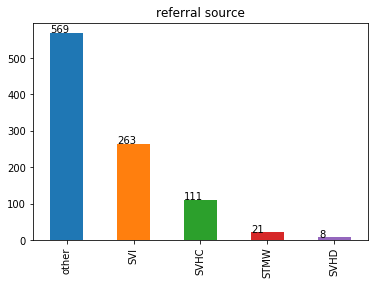

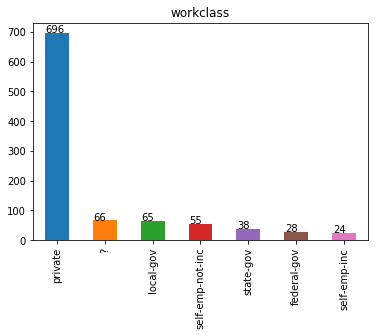

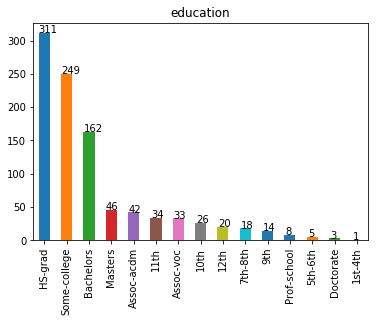

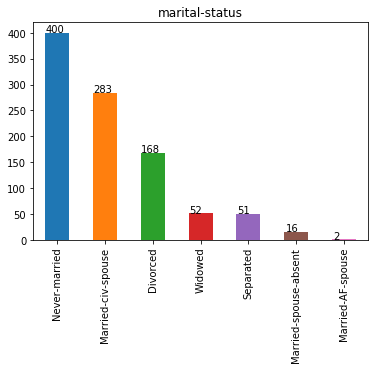

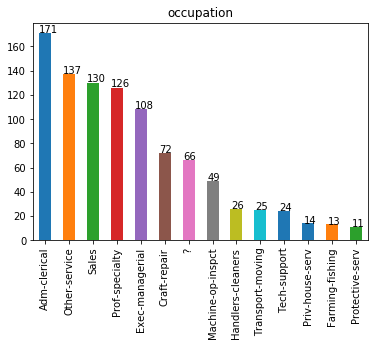

...

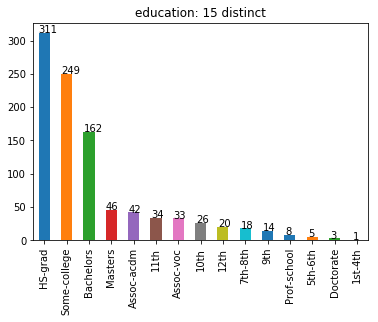

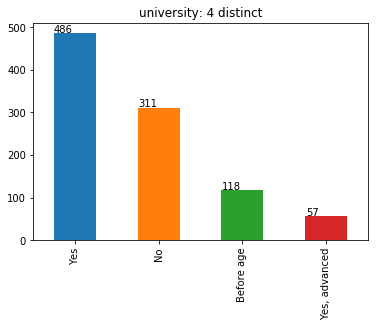

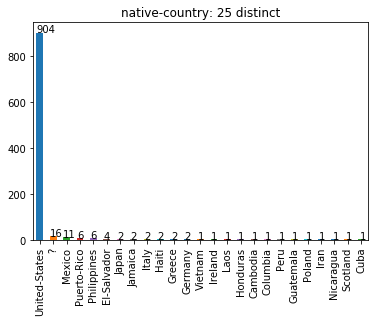

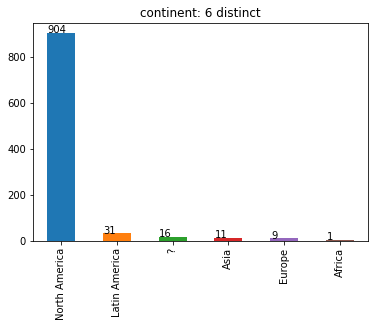

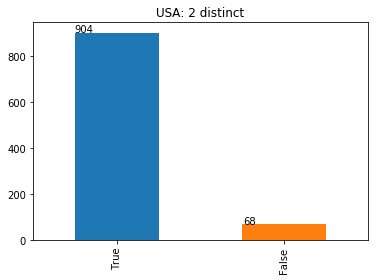

,referral source,workclass,education,marital-status,occupation,relationship,race,native-country,sex,workclass_basic,university,continent,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,T3 measured,FTI measured,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sick,class_sick,USA
count,972,972,972,972,972,972,972,972,972,972,972,972,972,972,972,972,972,972,972,972,972,972,972,972,972,972,972,972,972,972,972,972,972
unique,5,7,15,7,14,6,5,25,3,4,4,6,2,2,2,2,2,2,2,2,1,2,2,2,2,2,2,2,2,2,2,2,2
top,other,private,HS-grad,Never-married,Adm-clerical,Not-in-family,White,United-States,female,private,Yes,North America,False,False,False,False,False,False,False,False,False,True,True,True,True,True,False,False,False,False,False,False,True
freq,569,696,311,400,171,334,809,904,650,696,486,904,838,962,960,958,961,968,963,947,972,788,893,882,887,925,963,923,908,901,935,912,904


,age,TSH,T3,TT4,T4U,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week,FTI,class_num,year,month,day
count,972.000000,887.000000,788.000000,925.000000,882.000000,972.000000,875.000000,972.000000,972.000000,972.00000,882.000000,972.000000,972.000000,972.000000,972.000000
mean,51.423868,6.262835,1.981269,106.189622,0.986735,186275.113169,12.994286,621.021605,87.295267,37.72428,109.565533,1860.276749,1965.827160,6.135802,15.649177
std,18.966700,31.638353,0.835031,36.130949,0.198332,104159.935216,319.426193,4970.866815,395.316375,11.96554,33.669539,1083.076925,18.975483,3.392315,8.948610
min,7.000000,0.005000,0.200000,2.900000,0.250000,19410.000000,-1600.000000,0.000000,0.000000,1.00000,2.800000,21.000000,1925.000000,1.000000,1.000000
0.1%,10.884000,0.005000,0.200000,2.992400,0.346910,24566.981000,-1425.200000,0.000000,0.000000,1.00000,2.976200,24.884000,1925.000000,1.000000,1.000000
0.5%,13.710000,0.005000,0.200000,10.000000,0.488100,26668.855000,-1300.000000,0.000000,0.000000,3.00000,8.743000,31.420000,1929.000000,1.000000,1.000000
1%,15.000000,0.009300,0.300000,17.000000,0.598100,28600.910000,-1300.000000,0.000000,0.000000,5.00000,17.000000,48.840000,1930.000000,1.000000,1.000000
5%,20.000000,0.030000,0.800000,54.200000,0.720000,37844.050000,3.700000,0.000000,0.000000,15.00000,65.000000,193.200000,1938.000000,1.000000,2.000000
10%,25.000000,0.100000,1.100000,69.000000,0.780000,70555.400000,6.000000,0.000000,0.000000,20.00000,76.100000,409.200000,1942.000000,2.000000,3.000000
25%,35.000000,0.515000,1.500000,87.000000,0.870000,113541.250000,9.000000,0.000000,0.000000,35.00000,92.000000,901.500000,1950.750000,3.000000,8.000000


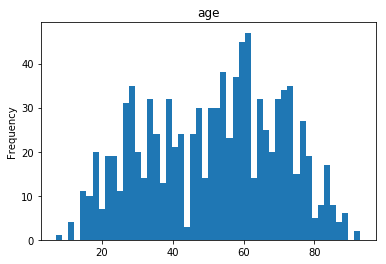

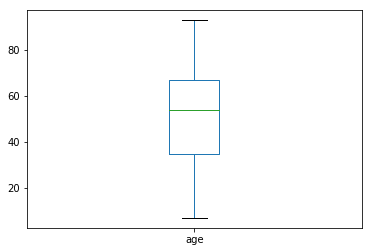

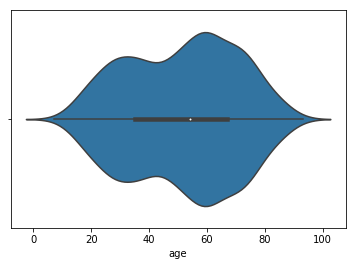

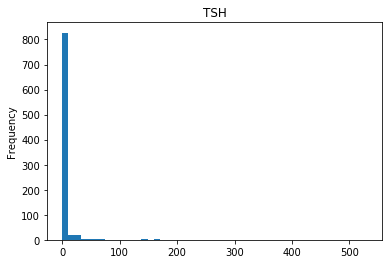

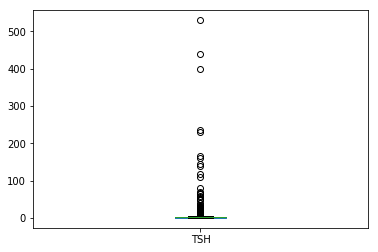

...

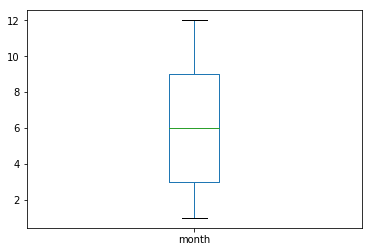

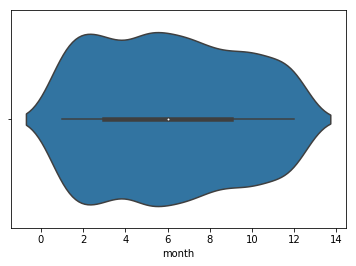

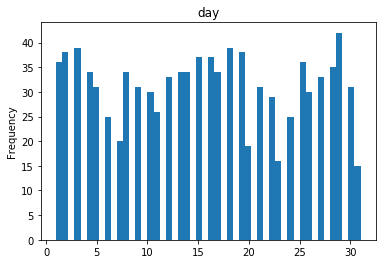

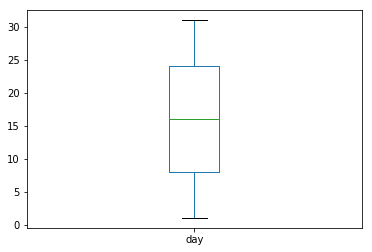

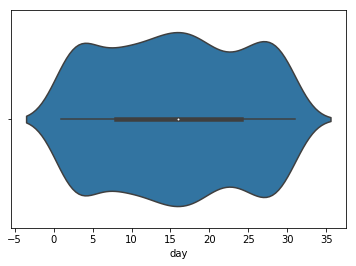

,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,referral source,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick,class_sick,class_num,year,month,day,workclass_basic,university,continent,USA


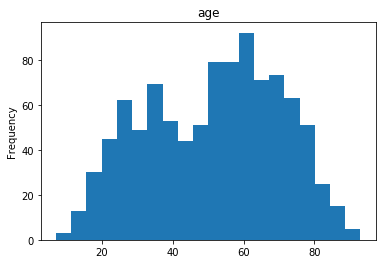

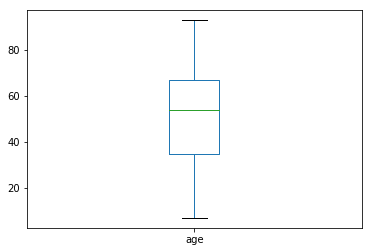

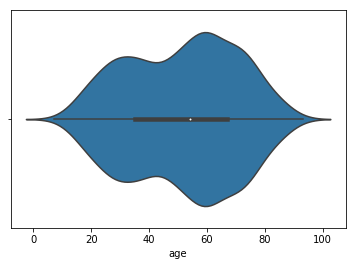

,TSH,class_sick
21,440.0,False
487,400.0,False
933,530.0,False


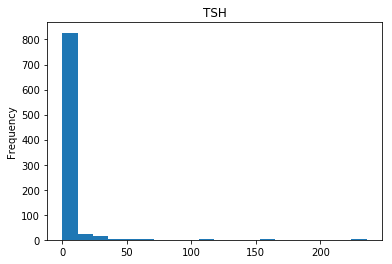

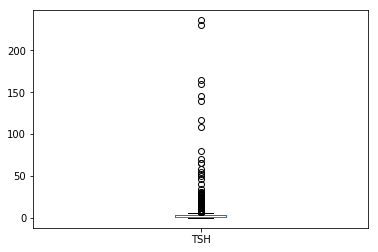

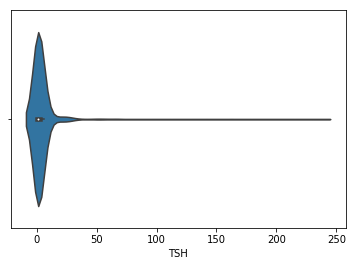

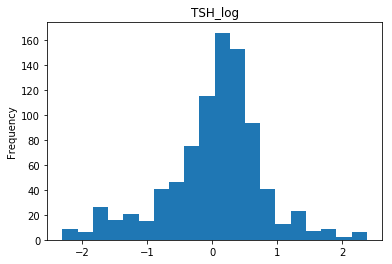

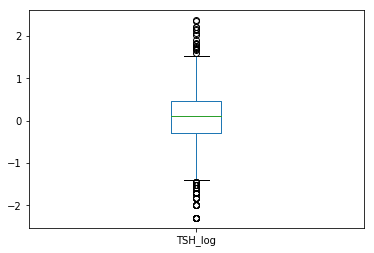

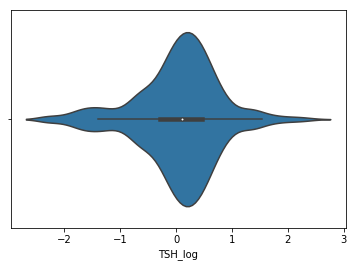

,T3,class_sick
898,8.5,False


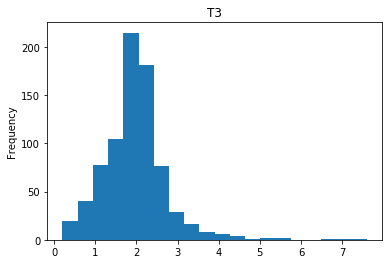

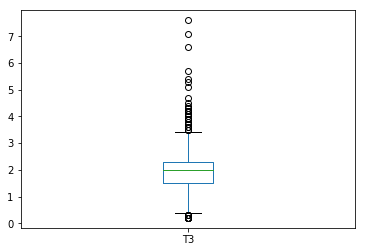

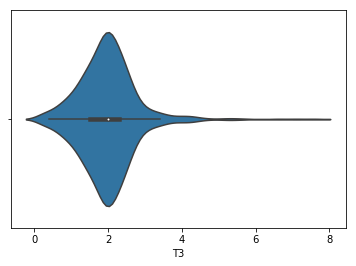

,TT4,class_sick
25,372.0,False


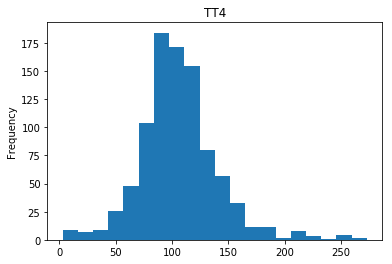

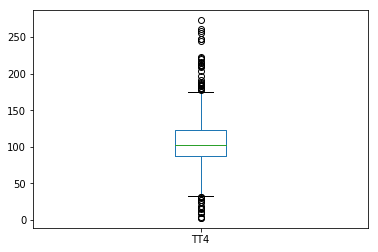

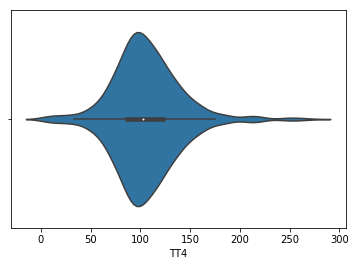

,capital-gain,class_sick
374,99999.0,False
422,99999.0,False


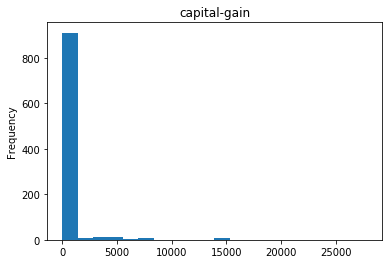

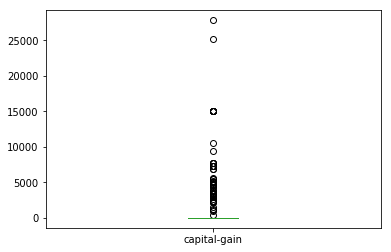

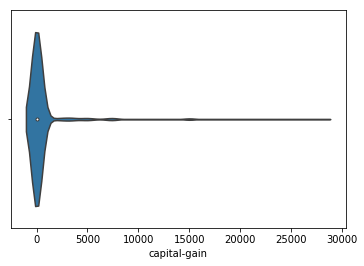

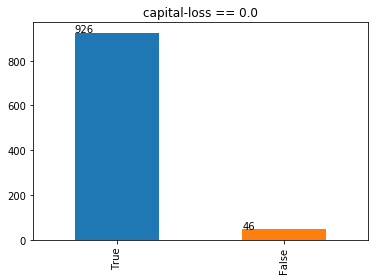

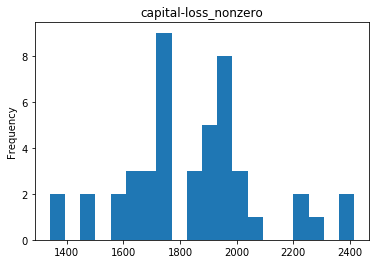

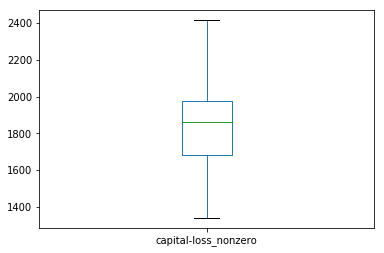

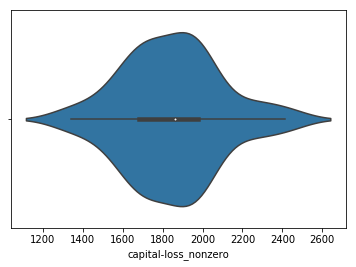

,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,referral source,workclass,sample-weight,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick,class_sick,class_num,year,month,day,workclass_basic,university,continent,USA,TSH_log,capital-loss_iszero,capital-loss_nonzero


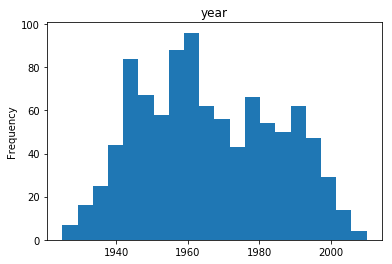

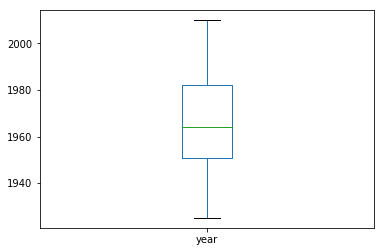

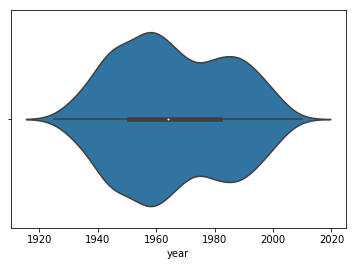

,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,TSH,T3 measured,T3,TT4,T4U,FTI measured,referral source,workclass,sample-weight,education,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,native-country,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick,class_sick,class_num,year,month,day,workclass_basic,university,continent,USA,TSH_log,capital-loss_iszero,capital-loss_nonzero


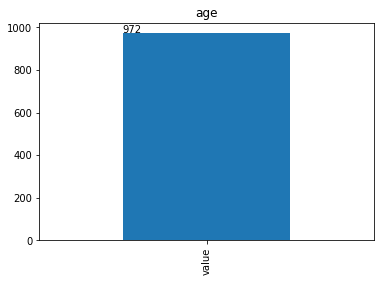

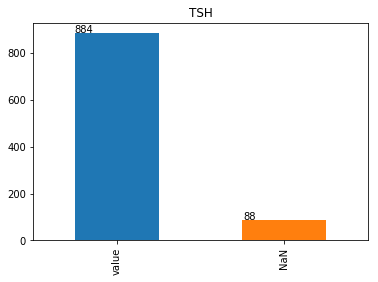

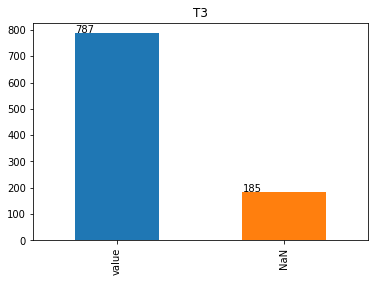

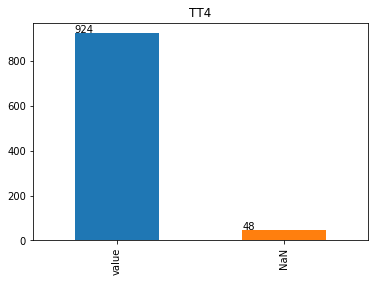

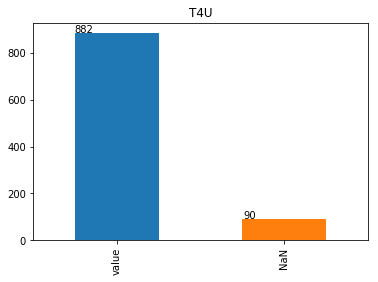

...

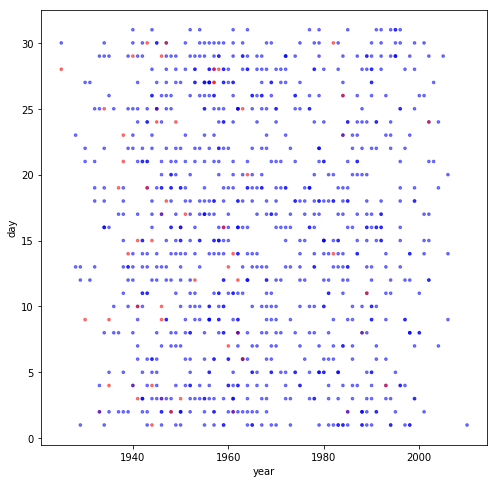

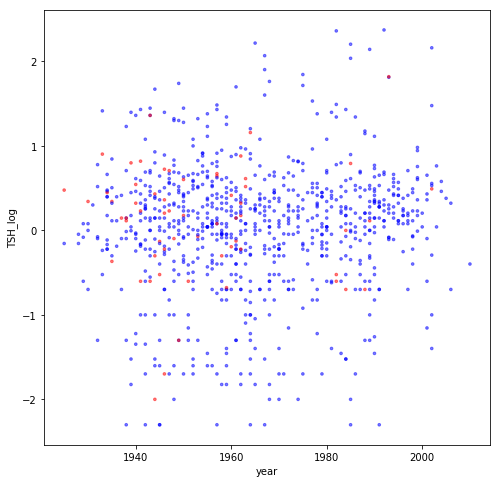

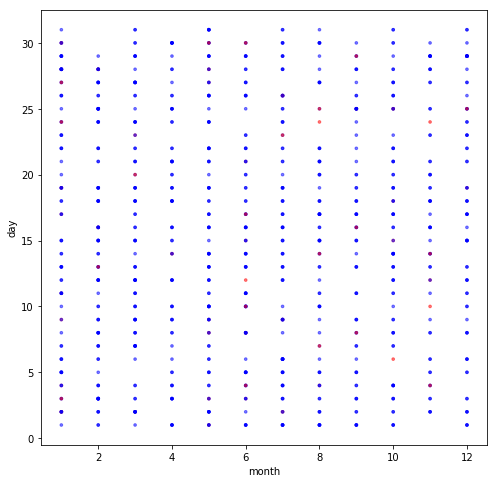

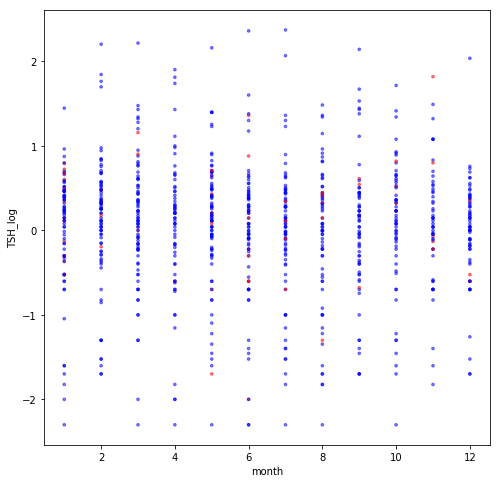

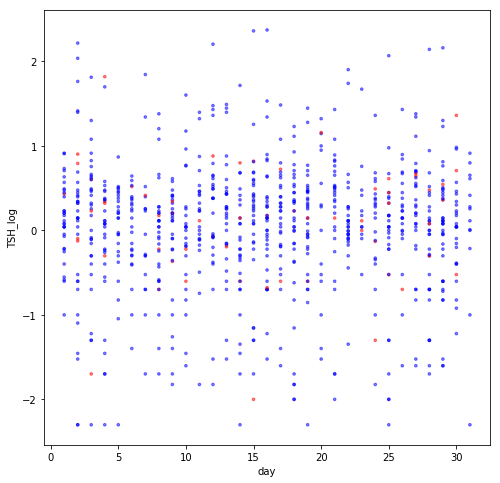

[2017. 2018.]


,age,year


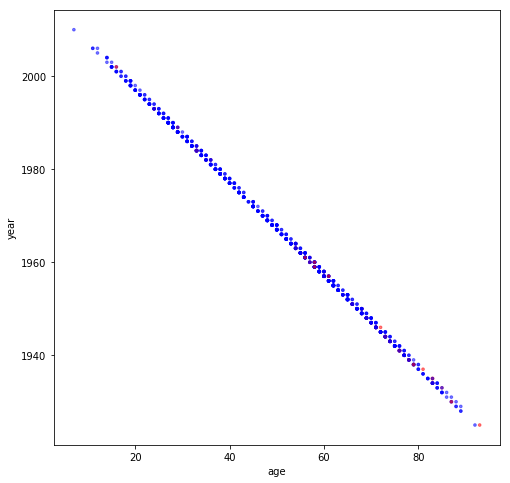

pearson correlation coefficient


,age,TSH,T3,TT4,T4U,sample-weight,education-num,capital-gain,capital-loss,hours-per-week,FTI,class_num,TSH_log
age,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TSH,NaN,1.000000,NaN,-0.336449,NaN,NaN,NaN,NaN,NaN,NaN,-0.375234,NaN,0.477641
T3,NaN,NaN,1.000000,0.514597,0.445576,NaN,NaN,NaN,NaN,NaN,0.314432,NaN,NaN
TT4,NaN,-0.336449,0.514597,1.000000,0.435879,NaN,NaN,NaN,NaN,NaN,0.779965,NaN,-0.431061
T4U,NaN,NaN,0.445576,0.435879,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sample-weight,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education-num,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
capital-gain,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
capital-loss,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
hours-per-week,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN


kendall correlation coefficient


,age,TSH,T3,TT4,T4U,sample-weight,education-num,capital-gain,capital-loss,hours-per-week,FTI,class_num,TSH_log
age,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TSH,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.315216,NaN,1.000000
T3,NaN,NaN,1.000000,NaN,0.323619,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TT4,NaN,NaN,NaN,1.000000,0.319871,NaN,NaN,NaN,NaN,NaN,0.567294,NaN,NaN
T4U,NaN,NaN,0.323619,0.319871,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sample-weight,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education-num,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
capital-gain,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
capital-loss,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
hours-per-week,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN


spearman correlation coefficient


,age,TSH,T3,TT4,T4U,sample-weight,education-num,capital-gain,capital-loss,hours-per-week,FTI,class_num,TSH_log
age,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TSH,NaN,1.000000,NaN,-0.361369,NaN,NaN,NaN,NaN,NaN,NaN,-0.439617,NaN,1.000000
T3,NaN,NaN,1.000000,0.400449,0.444868,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TT4,NaN,-0.361369,0.400449,1.000000,0.444581,NaN,NaN,NaN,NaN,NaN,0.732295,NaN,-0.361369
T4U,NaN,NaN,0.444868,0.444581,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sample-weight,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education-num,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN
capital-gain,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
capital-loss,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN
hours-per-week,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN


,education,education-num
0,Bachelors,13.0
1,HS-grad,9.0
2,Some-college,10.0
3,11th,7.0
4,9th,5.0
5,Masters,14.0
8,Assoc-acdm,12.0
9,7th-8th,4.0
15,Bachelors,NaN
17,Assoc-voc,11.0


Bachelors
[   13.    nan  1300. -1300.]
HS-grad
[   9.  900. -900.   nan]
Some-college
[   10.  1000. -1000.    nan]
11th
[   7. -700.   nan  700.]
9th
[   5.  500. -500.]
Masters
[   14. -1400.    nan]
Assoc-acdm
[   12.    nan  1200. -1200.]
7th-8th
[  4.  nan 400.]
Assoc-voc
[   11. -1100.    nan  1100.]
12th
[   8. -800.   nan]
10th
[   6.   nan  600. -600.]
Doctorate
[   16. -1600.]
5th-6th
[ 3. nan]
1st-4th
[2.]
Prof-school
[15. nan]


,education,education-num
0,Bachelors,13.0
1,HS-grad,9.0
2,Some-college,10.0
3,11th,7.0
4,9th,5.0
5,Masters,14.0
8,Assoc-acdm,12.0
9,7th-8th,4.0
17,Assoc-voc,11.0
35,12th,8.0


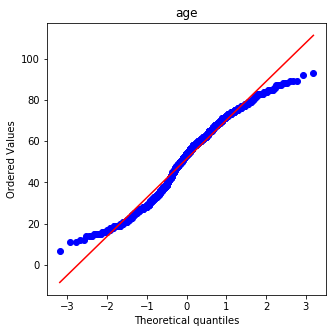

D:\Users\Pc\Miniconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in greater
  return (self.a < x) & (x < self.b)
D:\Users\Pc\Miniconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:879: RuntimeWarning: invalid value encountered in less
  return (self.a < x) & (x < self.b)
D:\Users\Pc\Miniconda3\lib\site-packages\scipy\stats\_distn_infrastructure.py:1821: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


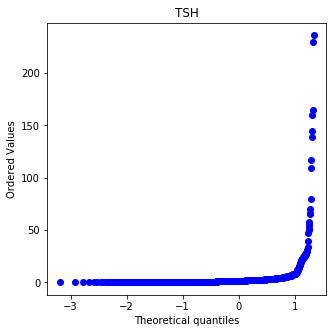

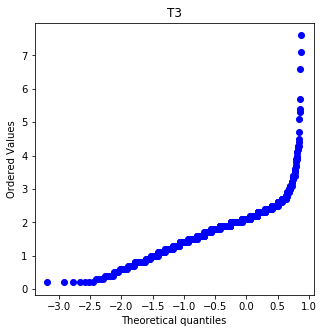

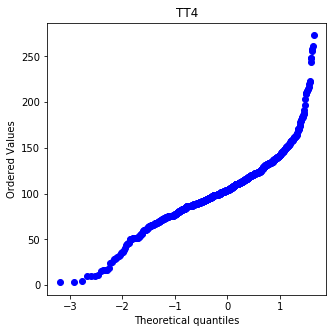

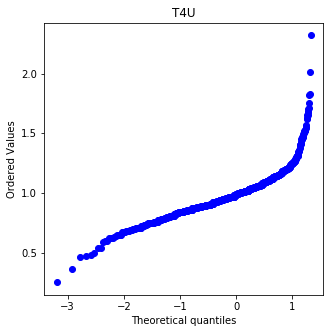

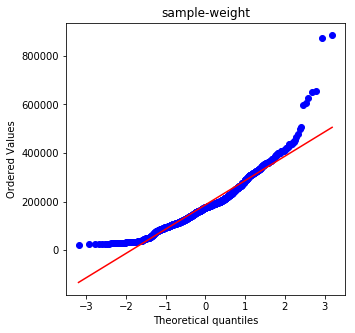

...

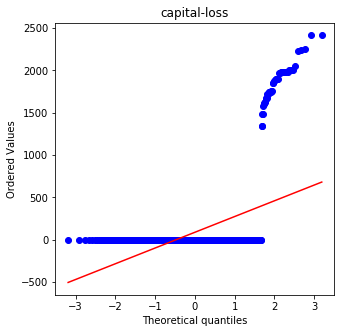

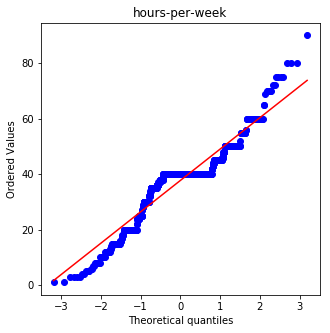

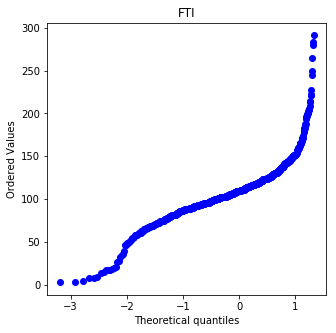

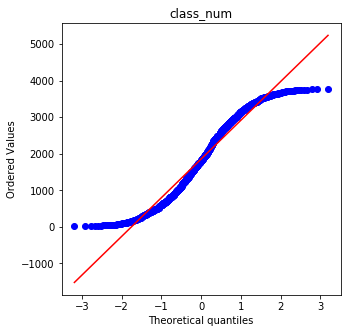

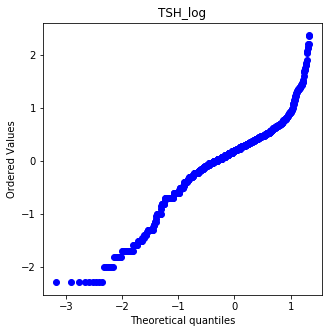

referral source
	 other 569
		 accuracy  36.93 %
		  weighted 39.07 %
		 precision 1.41 %
		  weighted 1.32 %
		 recall    13.33 %
		  weighted 13.71 %
		 F1 score  2.54 %
		  weighted 2.4 %
	 SVI 263
		 accuracy  76.65 %
		  weighted 75.58 %
		 precision 18.25 %
		  weighted 16.09 %
		 recall    80.0 %
		  weighted 82.22 %
		 F1 score  29.72 %
		  weighted 26.92 %
	 SVHC 111
		 accuracy  83.23 %
		  weighted 83.06 %
		 precision 3.6 %
		  weighted 1.87 %
		 recall    6.67 %
		  weighted 4.08 %
		 F1 score  4.68 %
		  weighted 2.57 %
	 SVHD 8
		 accuracy  93.0 %
		  weighted 93.69 %
		 precision 0.0 %
		  weighted 0.0 %
		 recall    0.0 %
		  weighted 0.0 %
		 F1 score  0.0 %
		  weighted 0.0 %
	 STMW 21
		 accuracy  91.67 %
		  weighted 92.19 %
		 precision 0.0 %
		  weighted 0.0 %
		 recall    0.0 %
		  weighted 0.0 %
		 F1 score  0.0 %
		  weighted 0.0 %
workclass
	 private 696
		 accuracy  31.89 %
		  weighted 30.4 %
		 precision 6.75 %
		  weighted 6.02 %
		 recall    78.33 %
		  

		 precision 0.0 %
		  weighted 0.0 %
		 recall    0.0 %
		  weighted 0.0 %
		 F1 score  0.0 %
		  weighted 0.0 %
	 Japan 2
		 accuracy  93.62 %
		  weighted 94.18 %
		 precision 0.0 %
		  weighted 0.0 %
		 recall    0.0 %
		  weighted 0.0 %
		 F1 score  0.0 %
		  weighted 0.0 %
	 El-Salvador 4
		 accuracy  93.62 %
		  weighted 94.34 %
		 precision 25.0 %
		  weighted 27.44 %
		 recall    1.67 %
		  weighted 2.12 %
		 F1 score  3.12 %
		  weighted 3.94 %
	 Philippines 6
		 accuracy  93.42 %
		  weighted 93.88 %
		 precision 16.67 %
		  weighted 6.4 %
		 recall    1.67 %
		  weighted 0.88 %
		 F1 score  3.03 %
		  weighted 1.54 %
	 Poland 1
		 accuracy  93.72 %
		  weighted 94.44 %
		 precision 0.0 %
		  weighted 0.0 %
		 recall    0.0 %
		  weighted 0.0 %
		 F1 score  0.0 %
		  weighted 0.0 %
	 Cambodia 1
		 accuracy  93.72 %
		  weighted 94.37 %
		 precision 0.0 %
		  weighted 0.0 %
		 recall    0.0 %
		  weighted 0.0 %
		 F1 score  0.0 %
		  weighted 0.0 %
	 Guatemala 1
		 accuracy  

		 F1 score  13.92 %
		  weighted 12.46 %
	 False 184
		 accuracy  75.1 %
		  weighted 76.02 %
		 precision 0.54 %
		  weighted 0.33 %
		 recall    1.67 %
		  weighted 1.11 %
		 F1 score  0.82 %
		  weighted 0.5 %
FTI measured
	 False 79
		 accuracy  86.11 %
		  weighted 87.03 %
		 precision 2.53 %
		  weighted 2.87 %
		 recall    3.33 %
		  weighted 4.17 %
		 F1 score  2.88 %
		  weighted 3.4 %
	 True 893
		 accuracy  13.89 %
		  weighted 12.97 %
		 precision 6.49 %
		  weighted 5.69 %
		 recall    96.67 %
		  weighted 95.83 %
		 F1 score  12.17 %
		  weighted 10.75 %
T4U measured
	 False 90
		 accuracy  85.19 %
		  weighted 86.1 %
		 precision 3.33 %
		  weighted 3.58 %
		 recall    5.0 %
		  weighted 5.94 %
		 F1 score  4.0 %
		  weighted 4.46 %
	 True 882
		 accuracy  14.81 %
		  weighted 13.9 %
		 precision 6.46 %
		  weighted 5.66 %
		 recall    95.0 %
		  weighted 94.06 %
		 F1 score  12.1 %
		  weighted 10.68 %
TSH measured
	 True 887
		 accuracy  14.92 %
		  weighted 14.11 %
	

,age,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,T3 measured,T3,TT4,T4U,FTI measured,referral source,workclass,education-num,marital-status,occupation,relationship,race,capital-gain,capital-loss,hours-per-week,FTI,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sex,sick,class_sick,class_num,workclass_basic,university,continent,USA,TSH_log,capital-loss_iszero
0,38.0,False,False,False,False,False,False,False,False,False,True,2.4,91.0,NaN,False,other,private,13.0,Never-married,Tech-support,Not-in-family,White,0.0,0.0,40.0,NaN,False,True,True,False,False,False,False,female,False,False,268.0,private,Yes,North America,True,-0.045757,True
1,48.0,False,False,False,False,False,False,False,False,False,False,NaN,112.0,0.92,True,other,self-emp-not-inc,9.0,Married-civ-spouse,Other-service,Wife,White,0.0,0.0,55.0,121.0,True,True,True,False,False,False,False,female,False,False,2758.0,self-emp,No,North America,True,0.447158,True
2,76.0,True,False,False,False,False,False,False,False,False,True,2.1,98.0,1.01,True,other,NaN,10.0,Never-married,NaN,Not-in-family,White,0.0,1602.0,20.0,97.0,True,True,True,False,False,False,False,female,False,False,21.0,NaN,Yes,North America,True,-1.000000,False
3,75.0,True,False,False,False,False,False,False,False,False,False,NaN,124.0,0.86,True,other,private,7.0,Married-civ-spouse,Other-service,Wife,White,0.0,0.0,40.0,144.0,True,True,True,False,False,False,False,female,False,False,3742.0,private,Before age,NaN,False,0.278754,True
4,64.0,False,False,False,False,False,False,False,False,False,True,4.2,164.0,1.55,True,other,NaN,5.0,Married-civ-spouse,NaN,Wife,Black,0.0,0.0,32.0,106.0,True,True,True,False,False,False,False,female,False,False,738.0,NaN,Before age,North America,True,0.880814,True


Save data to ./test_polished.csv


In [91]:
%run ./thyroid_preprocess.py -script test

## Imputing

Considering missing values, we aim to compare strategies:
- fill unknown with *global* descriptive statistics
    - Obtain middle value always from whole column per attribute
- fill unknown with *K nearest neighbors*
    - Calculate KNN with **euclidean** distance for **continuous** attributes
    - Calculate KNN with **hamming** distance for **discrete** attributes
    - Combine 2 neighborhood sets, obtain middle values for all missing attributes from their union for each patient (row) separately

In both cases:
- Use **median** for **continuous** attributes
- Use **mode** for **discrete** attributes

In [92]:
K=10

Note: K here is a rule of thumb integer. We could possibly try different values and evaluate. Interesting could be not using a single K but changing Ks ratio for continuous:discrete

In [93]:
df_train_polished = load_csv(FILE_PATH_POLISHED.format('train'))
df_test_polished = load_csv(FILE_PATH_POLISHED.format('test'))

Load data from ./train_polished.csv
Load data from ./test_polished.csv


### Linear regression

Exception from abovementioned imputing approach are *FTI* & *TT4*, for them we use observed linear relationship instead

First, demonstration what helper methods actually do

In [94]:
print('all NaN', len(all_nan_cols(df_train_polished[['FTI','TT4']])))
display(all_nan_cols(df_train_polished[['FTI','TT4']]).head())
print('any NaN', len(any_nan_cols(df_train_polished[['FTI','TT4']])))
display(any_nan_cols(df_train_polished[['FTI','TT4']]).head())
print('no NaN', len(no_nan_cols(df_train_polished[['FTI','TT4']])))
display(no_nan_cols(df_train_polished[['FTI','TT4']]).head())

all NaN 182


,FTI,TT4
23,NaN,NaN
30,NaN,NaN
99,NaN,NaN
141,NaN,NaN
145,NaN,NaN


any NaN 299


,FTI,TT4
23,NaN,NaN
30,NaN,NaN
33,NaN,14.0
54,NaN,73.0
77,395.0,NaN


no NaN 2501


,FTI,TT4
0,94.0,104.0
1,126.0,108.0
2,39.0,42.0
3,138.0,101.0
4,105.0,103.0


In [95]:
no_nan_subframe = no_nan_cols(df_train_polished[['TT4','FTI']])

lr_FTI_by_TT4 = LinearRegression().fit(X=no_nan_subframe[['TT4']], y=no_nan_subframe['FTI'])
FTI_by_TT4_train = df_train_polished[['TT4','FTI']][pd.notnull(df_train_polished['TT4']) & pd.isnull(df_train_polished['FTI'])]
df_train_polished.loc[FTI_by_TT4_train.index,'FTI'] = \
    df_train_polished.loc[FTI_by_TT4_train.index,'TT4'].apply(lambda x: lr_FTI_by_TT4.predict(x)[0])
FTI_by_TT4_test = df_test_polished[['TT4','FTI']][pd.notnull(df_test_polished['TT4']) & pd.isnull(df_test_polished['FTI'])]
df_test_polished.loc[FTI_by_TT4_test.index,'FTI'] = \
    df_test_polished.loc[FTI_by_TT4_test.index,'TT4'].apply(lambda x: lr_FTI_by_TT4.predict(x)[0])
# and reversed
lr_TT4_by_FTI = LinearRegression().fit(X=no_nan_subframe[['FTI']], y=no_nan_subframe['TT4'])
TT4_by_FTI_train = df_train_polished[['TT4','FTI']][pd.notnull(df_train_polished['FTI']) & pd.isnull(df_train_polished['TT4'])]
df_train_polished.loc[TT4_by_FTI_train.index,'TT4'] = \
    df_train_polished.loc[TT4_by_FTI_train.index,'FTI'].apply(lambda x: lr_TT4_by_FTI.predict(x)[0])
TT4_by_FTI_test = df_test_polished[['TT4','FTI']][pd.notnull(df_test_polished['FTI']) & pd.isnull(df_test_polished['TT4'])]
df_test_polished.loc[TT4_by_FTI_test.index,'TT4'] = \
    df_test_polished.loc[TT4_by_FTI_test.index,'FTI'].apply(lambda x: lr_TT4_by_FTI.predict(x)[0])

As expected, unknown values have been removed. However only for rows where we knew at least one of pair. Both missing will be served by main strategy

In [96]:
print('all NaN', len(all_nan_cols(df_train_polished[['FTI','TT4']])))
print('any NaN', len(any_nan_cols(df_train_polished[['FTI','TT4']])))
print('no NaN', len(no_nan_cols(df_train_polished[['FTI','TT4']])))
assert len(all_nan_cols(df_train_polished[['FTI','TT4']]))==len(any_nan_cols(df_train_polished[['FTI','TT4']]))
assert len(all_nan_cols(df_test_polished[['FTI','TT4']]))==len(any_nan_cols(df_test_polished[['FTI','TT4']]))

all NaN 182
any NaN 182
no NaN 2618


### Global fill

In [97]:
df_train = df_train_polished.copy()
df_test = df_test_polished.copy()

cont_cols = numcols(df_train)
print('numeric')
print(cont_cols)

disc_cols = catcols(df_train)
print('categoric')
print(disc_cols)

numeric
['age', 'T3', 'TT4', 'T4U', 'education-num', 'capital-gain', 'capital-loss', 'hours-per-week', 'FTI', 'class_num', 'TSH_log']
categoric
['referral source', 'workclass', 'marital-status', 'occupation', 'relationship', 'race', 'sex', 'workclass_basic', 'university', 'continent', 'on thyroxine', 'query on thyroxine', 'pregnant', 'thyroid surgery', 'I131 treatment', 'lithium', 'goitre', 'tumor', 'hypopituitary', 'T3 measured', 'FTI measured', 'T4U measured', 'TSH measured', 'TT4 measured', 'on antithyroid medication', 'psych', 'query hyperthyroid', 'query hypothyroid', 'sick', 'class_sick', 'USA', 'capital-loss_iszero']


Differentiate continuous & discrete columns to prevent chaos later

In [98]:
cont_cols.remove('class_num') # predicted
cont_cols.remove('education-num') # discrete
print('continuous')
print(cont_cols)

disc_cols.remove('class_sick') # predicted
disc_cols.append('education-num') # discrete
print('discrete')
print(disc_cols)

continuous
['age', 'T3', 'TT4', 'T4U', 'capital-gain', 'capital-loss', 'hours-per-week', 'FTI', 'TSH_log']
discrete
['referral source', 'workclass', 'marital-status', 'occupation', 'relationship', 'race', 'sex', 'workclass_basic', 'university', 'continent', 'on thyroxine', 'query on thyroxine', 'pregnant', 'thyroid surgery', 'I131 treatment', 'lithium', 'goitre', 'tumor', 'hypopituitary', 'T3 measured', 'FTI measured', 'T4U measured', 'TSH measured', 'TT4 measured', 'on antithyroid medication', 'psych', 'query hyperthyroid', 'query hypothyroid', 'sick', 'USA', 'capital-loss_iszero', 'education-num']


Fill by global middle values

In [99]:
# median for continuous
median_imputer = Imputer(strategy='median').fit(df_train[cont_cols])
df_train[cont_cols] = median_imputer.transform(df_train[cont_cols])
df_test[cont_cols] = median_imputer.transform(df_test[cont_cols])

# mode for discrete
mode_imputer = CatImputer(strategy='most_frequent').fit(df_train[disc_cols])
df_train[disc_cols] = mode_imputer.transform(df_train[disc_cols])
df_test[disc_cols] = mode_imputer.transform(df_test[disc_cols])

In [100]:
df_train_global = df_train.copy()
df_test_global = df_test.copy()

assert len(any_nan_cols(df_train_global))==0
assert len(any_nan_cols(df_test_global))==0

save_csv(df_train_global, FILE_PATH_GLOBAL.format('train'))
save_csv(df_test_global, FILE_PATH_GLOBAL.format('test'))

Save data to ./train_global.csv
Save data to ./test_global.csv


### KNN

Encoded version of discrete series' is necessary to calculate hamming distance

In [101]:
df_train_encoded = df_train[disc_cols].copy()
df_test_encoded = df_test[disc_cols].copy()
encoders = {} # keep encoders to re-use them later
for col in disc_cols:
    int_encoder = LabelEncoder().fit(df_train_encoded[col])
    encoders[col] = int_encoder
    df_train_encoded[col] = int_encoder.transform(df_train_encoded[col])
    df_test_encoded[col] = int_encoder.transform(df_test_encoded[col])

Basically we converted discrete values to corresponding, newly created integer ones

In [102]:
display(df_train_encoded.head())

,referral source,workclass,marital-status,occupation,relationship,race,sex,workclass_basic,university,continent,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,T3 measured,FTI measured,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sick,USA,capital-loss_iszero,education-num
0,3,2,4,5,2,4,0,1,1,4,0,0,0,0,0,0,0,0,0,1,1,1,1,1,0,0,0,0,0,1,1,15
1,4,2,4,6,3,4,0,1,2,4,0,0,0,0,0,0,0,1,0,1,1,1,1,1,0,0,0,0,0,1,1,1
2,4,1,0,8,1,4,0,0,3,4,0,0,0,0,0,0,0,0,0,1,1,1,1,1,0,0,0,0,0,1,1,5
3,3,2,2,5,0,2,1,1,0,4,0,0,0,0,0,0,0,0,0,1,1,1,1,1,0,0,0,0,0,1,1,10
4,3,2,4,6,1,4,0,1,1,4,0,0,0,0,0,0,0,0,0,1,1,1,1,1,0,1,0,0,0,1,1,15


Euclidean distance requires normalization for all attributes to have the same weight. We choose z-normalization with 5-95th interquantile range. We are afraid some continuous columns are not so useful for what we plan to do, so we exclude them

In [103]:
norm_cols = [x for x in cont_cols if x not in ['capital-gain','capital-loss']]
print('norm_cols')
print(norm_cols)

norm_cols
['age', 'T3', 'TT4', 'T4U', 'hours-per-week', 'FTI', 'TSH_log']


In [104]:
df_train_norm = df_train[norm_cols].copy()
df_test_norm = df_test[norm_cols].copy()
for col in norm_cols:
    mean_train = df_train_global[col].mean()
    q_range_train = df_train_global[col].quantile(.95) - df_train_global[col].quantile(.05)
    df_train_norm[col] = df_train_norm[col].apply(lambda x: (x - mean_train) / q_range_train) 
    df_test_norm[col] = df_test_norm[col].apply(lambda x: (x - mean_train) / q_range_train) 

Calculate both KNN types and combine neighborhoods

In [105]:
# euclidean distance for continuous
euclidean_neighbors = NearestNeighbors(n_neighbors=K, metric='euclidean').fit(df_train_norm)
df_train['num_neighbors'] = pd.Series(euclidean_neighbors.kneighbors(return_distance=False).tolist())
df_test['num_neighbors'] = pd.Series(euclidean_neighbors.kneighbors(df_test_norm, return_distance=False).tolist())
# hamming distance for discrete
hamming_neighbors = NearestNeighbors(n_neighbors=K, metric='hamming').fit(df_train_encoded)
df_train['cat_neighbors'] = pd.Series(hamming_neighbors.kneighbors(return_distance=False).tolist())
df_test['cat_neighbors'] = pd.Series(hamming_neighbors.kneighbors(df_test_encoded, return_distance=False).tolist())

df_train['neighbors'] = df_train['num_neighbors'] + df_train['cat_neighbors']
df_test['neighbors'] = df_test['num_neighbors'] + df_test['cat_neighbors']

In [106]:
# more robust method to check numPy's NaN
def is_nan(obj):
    return type(obj)==float and np.isnan(obj)

Fill by KNN subset's middle values

In [107]:
df_train_knn = df_train_polished.copy()
df_test_knn = df_test_polished.copy()

train_nan_count = len(any_nan_cols(df_train_knn))
for _, row in any_nan_cols(df_train_knn).iterrows():
    subframe = df_train_polished.filter(items=df_train['neighbors'][row.name], axis=0)
    for col in cont_cols:
        if is_nan(row[col]):
            v = subframe[col].median()
            df_train_knn[col][row.name] = df_train[col][row.name] if is_nan(v) else v
    for col in disc_cols:
        if is_nan(row[col]):
            v = subframe[col].mode()[0]
#             v = subframe[col].value_counts().idxmax() # another way to get mode
            df_train_knn[col][row.name] = df_train[col][row.name] if is_nan(v) else v
assert len(any_nan_cols(df_train_knn))==0

test_nan_count = len(any_nan_cols(df_test_knn))
for _, row in any_nan_cols(df_test_knn).iterrows():
    subframe = df_train_polished.filter(items=df_test['neighbors'][row.name], axis=0) # train is not a typo! neighbors are taken from trained model NOT test frame
    for col in cont_cols:
        if is_nan(row[col]):
            v = subframe[col].median()
            df_test_knn[col][row.name] = df_test[col][row.name] if is_nan(v) else v
    for col in disc_cols:
        if is_nan(row[col]):
            v = subframe[col].mode()[0]
#             v = subframe[col].value_counts().idxmax() # another way to get mode
            df_test_knn[col][row.name] = df_test[col][row.name] if is_nan(v) else v
assert len(any_nan_cols(df_test_knn))==0

D:\Users\Pc\Miniconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  # Remove the CWD from sys.path while we load stuff.
D:\Users\Pc\Miniconda3\lib\site-packages\ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
D:\Users\Pc\Miniconda3\lib\site-packages\ipykernel_launcher.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
D:\Users\Pc\Miniconda3\lib\site-packages\ipykernel_launcher.py

In [108]:
assert len(any_nan_cols(df_train_polished))==train_nan_count
assert len(any_nan_cols(df_test_polished))==test_nan_count

save_csv(df_train_knn, FILE_PATH_KNN.format('train'))
save_csv(df_test_knn, FILE_PATH_KNN.format('test'))

df_train_polished, df_test_polished = None, None

Save data to ./train_knn.csv
Save data to ./test_knn.csv


## Outlier substitution

Considering outliers, we aim to compare strategies:
- keep outliers (do nothing)
- removal
- replace outliers by 5th & 95th percentile per attribute

In both latter cases outlier treshold is defined analogously by 5th & 95th percentile

In [109]:
outlier_strategies = [FILE_PATH_GLOBAL_REMOVAL, FILE_PATH_GLOBAL_PERCENTILE, FILE_PATH_KNN_REMOVAL, FILE_PATH_KNN_PERCENTILE]

In case of some attributes, "outliers" substitution could malform data, thus it is undesired

In [110]:
# here we list continuous attributes to skip
skip_lower_quantile = ['capital-gain','capital-loss'] # no outliers
skip_upper_quantile = ['capital-gain','capital-loss'] # would damage information contained in data

Save data to ./train_global_removal.csv
Save data to ./test_global_removal.csv


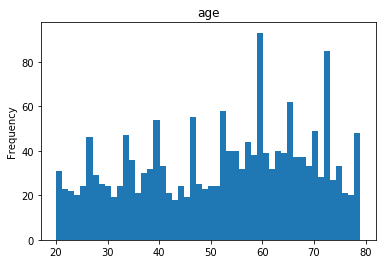

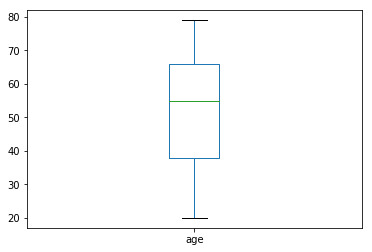

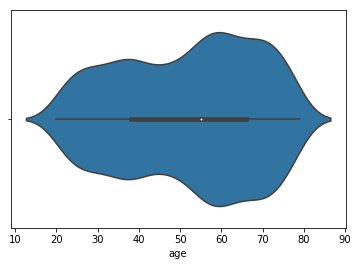

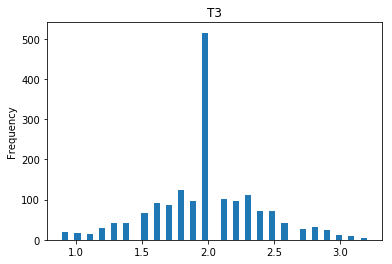

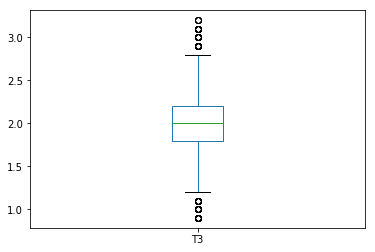

...

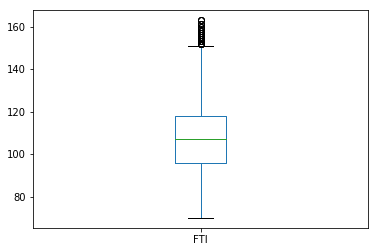

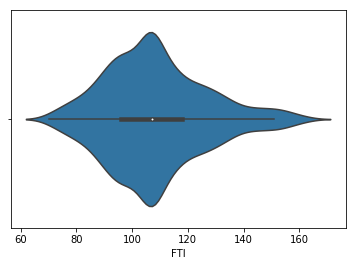

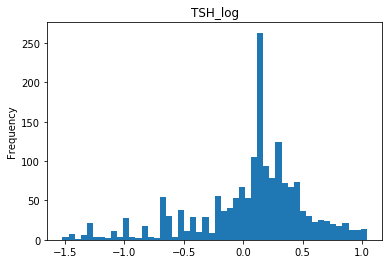

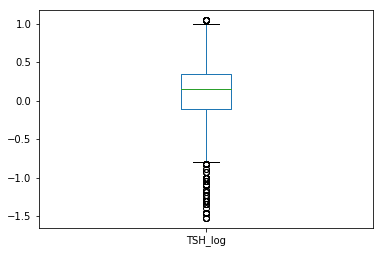

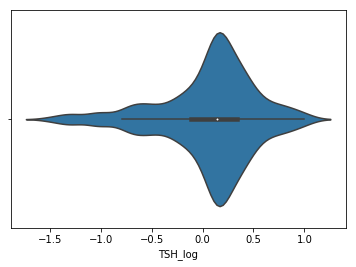

Save data to ./train_global_percentile.csv
Save data to ./test_global_percentile.csv


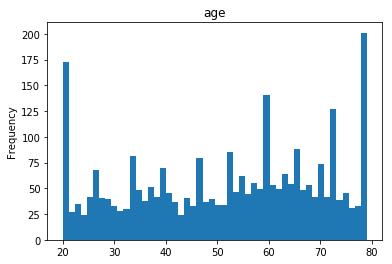

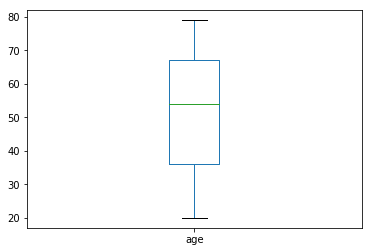

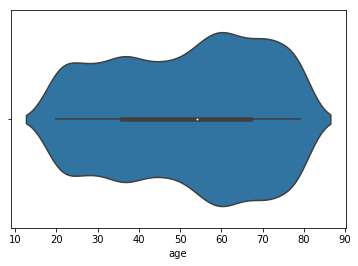

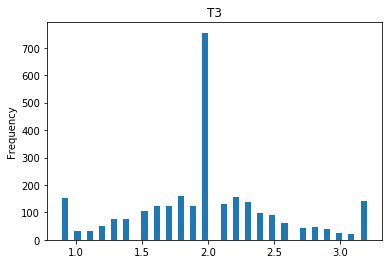

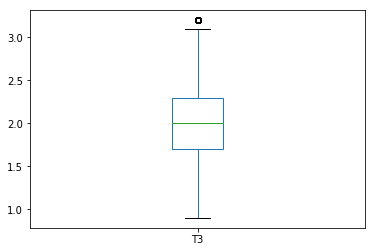

...

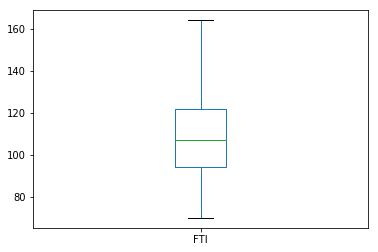

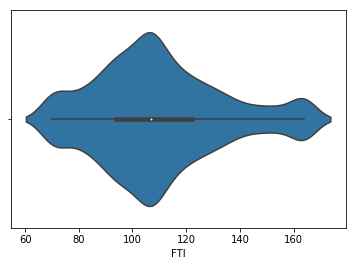

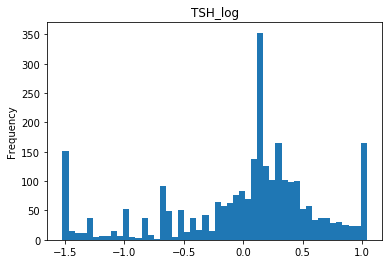

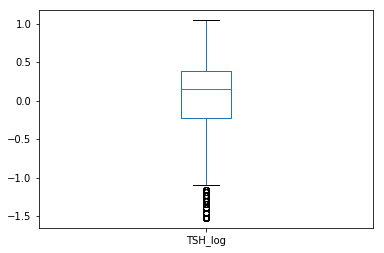

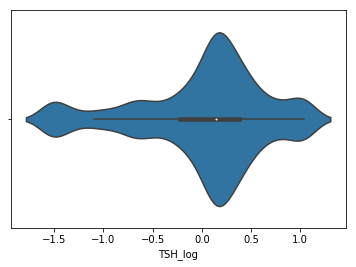

Save data to ./train_knn_removal.csv
Save data to ./test_knn_removal.csv


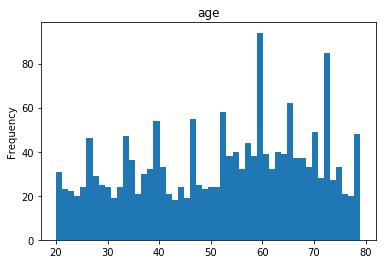

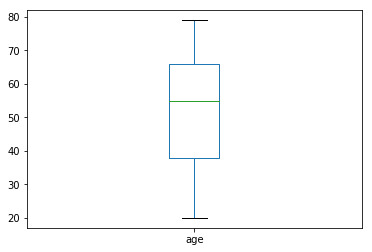

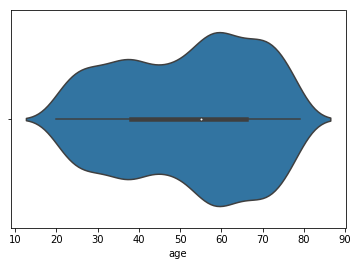

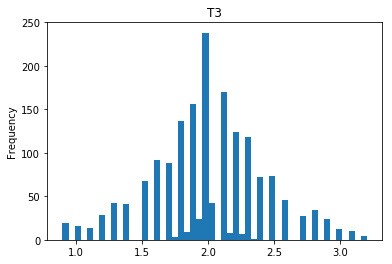

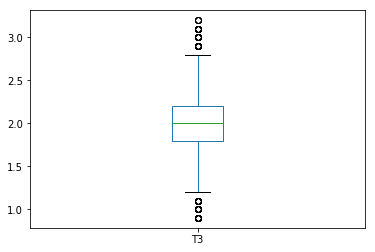

...

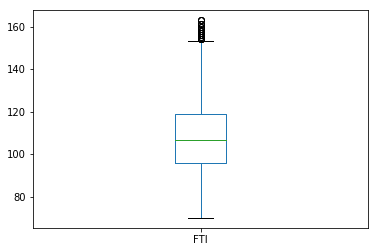

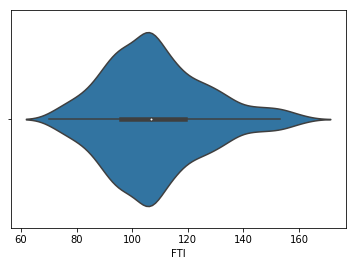

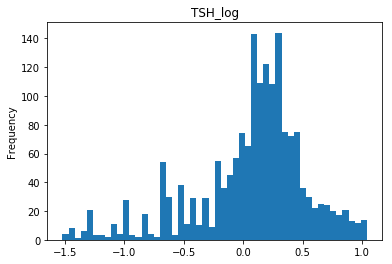

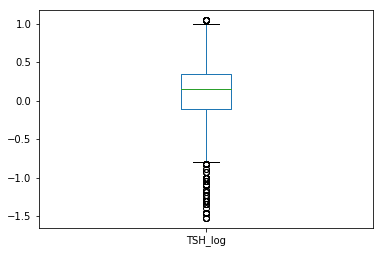

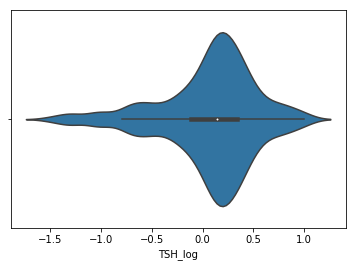

Save data to ./train_knn_percentile.csv
Save data to ./test_knn_percentile.csv


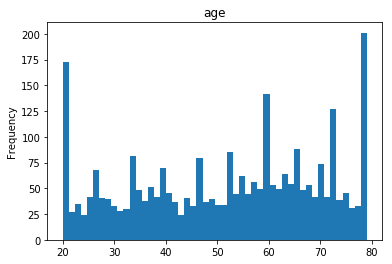

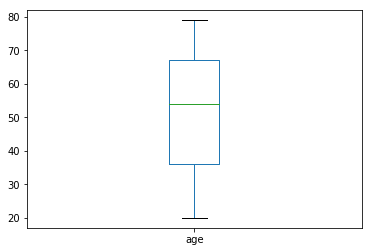

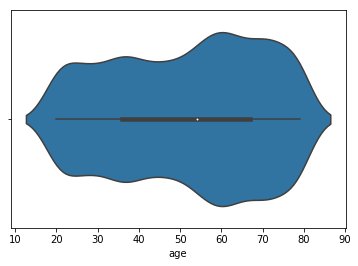

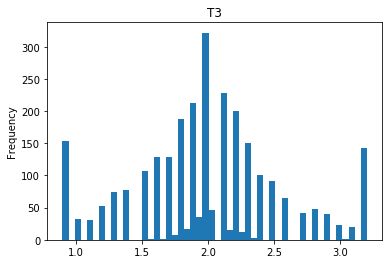

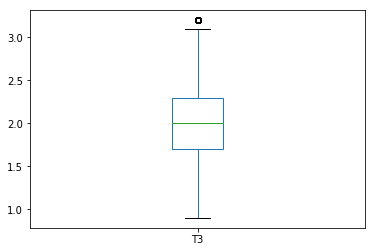

...

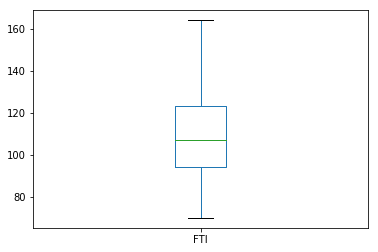

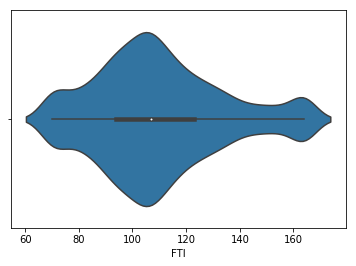

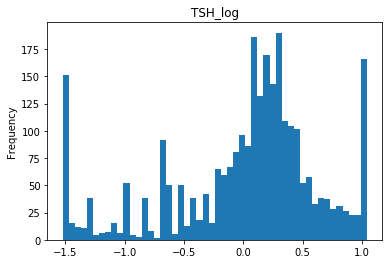

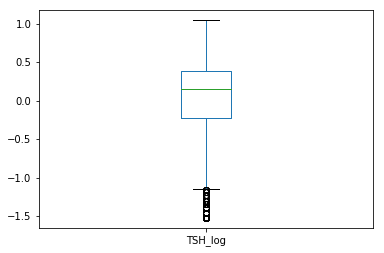

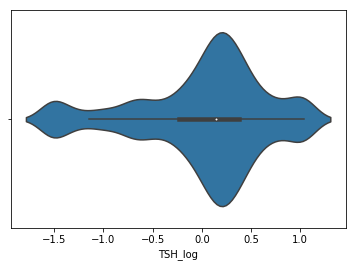

In [111]:
for path in outlier_strategies:
    # prepare
    df_train, df_test = None, None
    quantile_05, quantile_95 = None, None
    if path in [FILE_PATH_GLOBAL_REMOVAL, FILE_PATH_GLOBAL_PERCENTILE]:
        df_train = df_train_global.copy()
        df_test = df_test_global.copy()
        quantile_05 = df_train_global[cont_cols].quantile(.05)
        quantile_95 = df_train_global[cont_cols].quantile(.95)
    elif path in [FILE_PATH_KNN_REMOVAL, FILE_PATH_KNN_PERCENTILE]:
        df_train = df_train_knn.copy()
        df_test = df_test_knn.copy()
        quantile_05 = df_train_knn[cont_cols].quantile(.05)
        quantile_95 = df_train_knn[cont_cols].quantile(.95)
    # remove outliers
    if path in [FILE_PATH_GLOBAL_REMOVAL, FILE_PATH_KNN_REMOVAL]:
        for col in cont_cols:
            if col not in skip_lower_quantile:
                df_train = df_train[df_train[col] >= quantile_05[col]]
                df_test = df_test[df_test[col] >= quantile_05[col]]
            if col not in skip_upper_quantile:
                df_train = df_train[df_train[col] <= quantile_95[col]]
                df_test = df_test[df_test[col] <= quantile_95[col]]
    # replace outliers by 5th & 95th percentile
    elif path in [FILE_PATH_GLOBAL_PERCENTILE, FILE_PATH_KNN_PERCENTILE]:
        for col in cont_cols:
            if col not in skip_lower_quantile:
                df_train[col] = df_train[col].apply(lambda x: quantile_05[col] if x < quantile_05[col] else x)
                df_test[col] = df_test[col].apply(lambda x: quantile_05[col] if x < quantile_05[col] else x)
            if col not in skip_upper_quantile:
                df_train[col] = df_train[col].apply(lambda x: quantile_95[col] if x > quantile_95[col] else x)
                df_test[col] = df_test[col].apply(lambda x: quantile_95[col] if x > quantile_95[col] else x)
    save_csv(df_train, path.format('train'))
    save_csv(df_test, path.format('test'))
    [contplot(df_train[col], bins=50) for col in cont_cols];

To sum up, we do have  
**2** imputing **x 3** outlier = **6** strategies   
(+ linear regression applied within all in case of the found correlated pair)

## Decision trees

In [112]:
model_cols = cont_cols + disc_cols
print('model_cols')
print(model_cols)

model_cols
['age', 'T3', 'TT4', 'T4U', 'capital-gain', 'capital-loss', 'hours-per-week', 'FTI', 'TSH_log', 'referral source', 'workclass', 'marital-status', 'occupation', 'relationship', 'race', 'sex', 'workclass_basic', 'university', 'continent', 'on thyroxine', 'query on thyroxine', 'pregnant', 'thyroid surgery', 'I131 treatment', 'lithium', 'goitre', 'tumor', 'hypopituitary', 'T3 measured', 'FTI measured', 'T4U measured', 'TSH measured', 'TT4 measured', 'on antithyroid medication', 'psych', 'query hyperthyroid', 'query hypothyroid', 'sick', 'USA', 'capital-loss_iszero', 'education-num']


In [113]:
# helper method to prepare classifier inputs
def tree_input(frame):
    df = frame.copy()

    is_sick = df['class_sick']
    df = df.filter(model_cols)
    
    # re-use encoders from above
    for col in disc_cols:
        df[col] = encoders[col].transform(df[col].apply(str))
        
    return df, is_sick

We proceed with building a model from data we have prepared by different strategies. First an example of classification algorithm which we aim to use - decision trees

In [114]:
df_features, df_labels = tree_input(df_train_global)
df_train, df_test, is_sick_train, is_sick_test = train_test_split(df_features, df_labels, test_size=.2, random_state=42)
display(df_train.head())

,age,T3,TT4,T4U,capital-gain,capital-loss,hours-per-week,FTI,TSH_log,referral source,workclass,marital-status,occupation,relationship,race,sex,workclass_basic,university,continent,on thyroxine,query on thyroxine,pregnant,thyroid surgery,I131 treatment,lithium,goitre,tumor,hypopituitary,T3 measured,FTI measured,T4U measured,TSH measured,TT4 measured,on antithyroid medication,psych,query hyperthyroid,query hypothyroid,sick,USA,capital-loss_iszero,education-num
461,35.0,2.0,89.0,1.10,0.0,0.0,20.0,81.0,0.146128,4,2,2,0,5,4,0,1,2,4,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,0,1,1,1
903,57.0,2.4,81.0,0.89,0.0,0.0,48.0,91.0,-1.000000,4,2,5,5,3,4,0,1,0,4,0,0,0,0,1,0,0,0,0,1,1,1,1,1,0,0,0,0,0,1,1,12
157,44.0,1.3,93.0,0.87,0.0,0.0,40.0,107.0,0.230449,3,2,3,4,4,4,0,1,0,4,0,0,0,0,0,0,0,0,0,1,1,1,1,1,0,0,0,0,0,1,1,13
1677,25.0,2.8,106.0,1.32,0.0,1980.0,40.0,81.0,-0.091515,1,2,0,2,1,4,0,1,2,4,0,0,0,0,0,0,0,0,0,1,1,1,1,1,0,0,0,0,0,1,0,1
1472,49.0,2.2,100.0,0.93,0.0,0.0,40.0,108.0,0.079181,1,2,2,8,5,4,0,1,2,4,0,0,0,0,0,0,0,0,0,1,1,1,1,1,0,0,0,0,0,1,1,4


In [115]:
dtc = DecisionTreeClassifier(random_state=0).fit(X=df_train, y=is_sick_train)
print('Feature importances:')
for col, importance in zip(model_cols, dtc.feature_importances_):
    print(col, percent(importance), sep='\t')

Feature importances:
age	3.96 %
T3	58.16 %
TT4	14.29 %
T4U	0.58 %
capital-gain	0.0 %
capital-loss	0.0 %
hours-per-week	0.0 %
FTI	7.28 %
TSH_log	6.52 %
referral source	4.32 %
workclass	0.0 %
marital-status	0.66 %
occupation	0.67 %
relationship	0.0 %
race	0.0 %
sex	0.0 %
workclass_basic	0.69 %
university	0.0 %
continent	0.0 %
on thyroxine	1.06 %
query on thyroxine	0.0 %
pregnant	0.0 %
thyroid surgery	0.0 %
I131 treatment	0.0 %
lithium	0.0 %
goitre	0.0 %
tumor	0.0 %
hypopituitary	0.0 %
T3 measured	1.82 %
FTI measured	0.0 %
T4U measured	0.0 %
TSH measured	0.0 %
TT4 measured	0.0 %
on antithyroid medication	0.0 %
psych	0.0 %
query hyperthyroid	0.0 %
query hypothyroid	0.0 %
sick	0.0 %
USA	0.0 %
capital-loss_iszero	0.0 %
education-num	0.0 %


Input values do not need to be normalized across attributes before. Speaking about continuous variables only, we can see immediately that the prediction tends to use mainly *T3* level. More complex summary of probable attributes influence:
- *T3* level has a substantial influnce on disease
- *T4U* level seems NOT to have such an influnce on disease as we thought before
- *FTI* level has an influnce on disease (probably somehow associated with *TT4*)
- *TT4* level has an influnce on disease (probably somehow associated with *FTI*)
- *age* level has an influnce on disease
- *T3 measured* level has an influnce on disease (probably associated somehow with *T3* - biology not data supported argument: tested due to *T3* medication)
- *on thyroxine* level has an influnce on disease (probably associated somehow with *T3* - biology not data supported argument: low *T3* medication)
- *query hyperthyroid* level has an influnce on disease (probably associated somehow with *T3* - biology not data supported argument: tested due to *T3* medication)
- *referral source* level has an influnce on disease

We have expected many of mentioned since we have already indentified it and concluded their influence, mostly after scatter plots. However, conclusions suggested here are based on the previous decision trees snippet only and may not turn out to be exactly true in final predicion (meaning hyperparameter optimized model not test set).   
Finally, evaluate by different metrics

In [116]:
prediction = dtc.predict(df_test)
print('accuracy ', percent(metrics.accuracy_score(y_true=is_sick_test, y_pred=prediction)))
print('precision', percent(metrics.precision_score(y_true=is_sick_test, y_pred=prediction, average='macro')))
print('recall   ', percent(metrics.recall_score(y_true=is_sick_test, y_pred=prediction, average='macro')))
print('F1 score ', percent(metrics.f1_score(y_true=is_sick_test, y_pred=prediction, average='macro')))

accuracy  98.57 %
precision 91.9 %
recall    94.53 %
F1 score  93.17 %


### Cross validation

We are to use cross validation for hyperparameter tuning. In particular, we are interested in following hyperparameters:
- *min_samples_leaf*: minimal number of individuals (patients from train set) in each leaf (ending node) of built decision tree
- *max_depth*: maximal depth of built decision tree

In [117]:
# estimate optimal DecisionTreeClassifier hyperparameters
def est_hparams_dtc(features, labels):
    hyperparam = {}
    for depth in range(1,20):
        for leaf in range(1,10):
            cv_score = cross_val_score( \
                DecisionTreeClassifier(random_state=0, max_depth=depth, min_samples_leaf=leaf), \
                X=features, y=labels, cv=10, scoring='recall_macro')
            hyperparam['{} {}'.format(depth,leaf)] = cv_score.mean()
    top_h = max(hyperparam, key=hyperparam.get)
    max_depth, min_samples_leaf = [int(x) for x in top_h.split(' ')]
    return max_depth, min_samples_leaf, hyperparam[top_h]

In [118]:
max_depth, min_samples_leaf, top_mean = est_hparams_dtc(df_train, is_sick_train)
print('Best hyperparameter combination:')
print('max_depth', max_depth)
print('min_samples_leaf', min_samples_leaf)
print('mean macro recall', percent(top_mean))

Best hyperparameter combination:
max_depth 1
min_samples_leaf 1
mean macro recall 92.24 %


We have been boosting recall since, as usual in medicine, we prefer avoiding Type II error. This could be subject to change though. We use **macro** evaluation to keep equal importance of individual classes

In [119]:
dtc = DecisionTreeClassifier(random_state=0, max_depth=max_depth, min_samples_leaf=min_samples_leaf)
dtc = dtc.fit(X=df_train, y=is_sick_train)
prediction = dtc.predict(df_test)
print('accuracy ', percent(metrics.accuracy_score(y_true=is_sick_test, y_pred=prediction)))
print('precision', percent(metrics.precision_score(y_true=is_sick_test, y_pred=prediction, average='macro')))
print('recall   ', percent(metrics.recall_score(y_true=is_sick_test, y_pred=prediction, average='macro')))
print('F1 score ', percent(metrics.f1_score(y_true=is_sick_test, y_pred=prediction, average='macro')))

accuracy  97.14 %
precision 83.83 %
recall    92.2 %
F1 score  87.47 %


### Strategies comparison

In [120]:
strategies = [FILE_PATH_GLOBAL, FILE_PATH_GLOBAL_REMOVAL, FILE_PATH_GLOBAL_PERCENTILE, \
              FILE_PATH_KNN, FILE_PATH_KNN_REMOVAL, FILE_PATH_KNN_PERCENTILE]

The code above was more or less only for demonstration. Since we want to compare concrete different outlier and imputing strategies from previous work, we need a loop. We determine hyperparameters by cross validation for each strategy separately. Last mentioned choice is also expected to have an influence on results.

In [121]:
for path in strategies:
    df_train, is_sick_train = tree_input(load_csv(path.format('train')))
    df_test, is_sick_test = tree_input(load_csv(path.format('test')))
    max_depth, min_samples_leaf, _ = est_hparams_dtc(df_train, is_sick_train)
    print('max_depth', max_depth, 'min_samples_leaf', min_samples_leaf)
    dtc = DecisionTreeClassifier(random_state=0, max_depth=max_depth, min_samples_leaf=min_samples_leaf)
    dtc = dtc.fit(X=df_train, y=is_sick_train)
    prediction = dtc.predict(df_test)
    print('accuracy ', percent(metrics.accuracy_score(y_true=is_sick_test, y_pred=prediction)))
    print('precision', percent(metrics.precision_score(y_true=is_sick_test, y_pred=prediction, average='macro')))
    print('recall   ', percent(metrics.recall_score(y_true=is_sick_test, y_pred=prediction, average='macro')))
    print('F1 score ', percent(metrics.f1_score(y_true=is_sick_test, y_pred=prediction, average='macro')))
    print()

Load data from ./train_global.csv
Load data from ./test_global.csv
max_depth 8 min_samples_leaf 2
accuracy  98.15 %
precision 92.01 %
recall    92.01 %
F1 score  92.01 %

Load data from ./train_global_removal.csv
Load data from ./test_global_removal.csv
max_depth 2 min_samples_leaf 8
accuracy  99.66 %
precision 96.07 %
recall    96.07 %
F1 score  96.07 %

Load data from ./train_global_percentile.csv
Load data from ./test_global_percentile.csv
max_depth 6 min_samples_leaf 1
accuracy  98.35 %
precision 93.47 %
recall    92.12 %
F1 score  92.78 %

Load data from ./train_knn.csv
Load data from ./test_knn.csv
max_depth 8 min_samples_leaf 2
accuracy  98.46 %
precision 93.63 %
recall    92.95 %
F1 score  93.29 %

Load data from ./train_knn_removal.csv
Load data from ./test_knn_removal.csv
max_depth 2 min_samples_leaf 8
accuracy  99.65 %
precision 96.07 %
recall    96.07 %
F1 score  96.07 %

Load data from ./train_knn_percentile.csv
Load data from ./test_knn_percentile.csv
max_depth 6 min_samp

First, commenting outlier substitution strategies, outlier removal outperformed both keeping outliers and squeezing 5% boundaries, whereas the latter two finished with approximately similar results. Implied strategy, to build a model and predict based on it, then could start with removing outliers. In case of additional, new data, however, suggested is to apply only if two conditions are fulfiled (conditions are concluded from current train set):
- Aberrant attributes are more or less tight to limited number of individuals, meaning not having outier-like attributes across many individuals, but rather more out-of-normal attributes within same indivuduals. It ensures not losing too much information after removing too many individuals just because they contain few missing values.
- Outliers will be quite "occasional" too, meaning both 5% boundaries do not contain extreme differences from dataset distribution "center". I suppose that NOT very outstanding outliers caused the similar behaviour of keeping and squeezing boundaries.

Moving to missing values substitution, we end up with even more surprising results. Basically, complex approach using combined, two-metrics kNN had similar performance to simply filling missing fields with global distribution values (median, mode). Possible explanation could be achieved after a short insight into drawbacks of kNN.

K nearest neighbours is, in general, believed to identify relationships of individuals plausibly. It takes into account all pairs' similarities (distances), and we pay for that with time complexity O(n<sup>2</sup>) as well. Although this fact is nice, kNN is known to have big troubles in case of datasets with different local densities. The problem is only a single K is always chosen. Implications:
- When K is too small, the problem occurs in dense regions. Quite similar objects may not become neighbours because the real neighbourhood of the object contains too many objects relative to chosen K.
- When K is too large, the problem occurs in sparse regions. Quite different objects may become neighbours because the real neighbourhood of the object contains too few objects relative to chosen K.   

Previous is quite self-explanary and suggests why kNN might have failed.

Another observation is against kNN. Remember how we extracted attributes that actually had effect on decision trees (T3, TT4 etc. - important is that NOT many of them matter). Now, it is obvious that despite using kNN we actually have NOT done an effective multi-dimensional analysis since most of attributes were irrelevant <u>with respect to</u> tyroid disease. Interesting might be to rewrite previous pre-process code and calculate kNN using only relevant attributes (those suggested by decision trees).

## Random forest

This project have focused mainly on decision trees. Despite we try to obtain better results by another algorithm, random forest, which is based on group ("forest") of decision trees. We also include hyperparameter tunning via cross validation. We are interested in following hyperparameters (first two matching decision trees):
- *min_samples_leaf*
- *max_depth*
- *n_estimators*: n trees in forest

In [124]:
# estimate optimal RandomForestClassifier hyperparameters
def est_hparams_rfc(features, labels):
    hyperparam = {}
    for depth in range(1,20):
        for leaf in range(1,10):
             for n in [1,3,7,15,25,45,65,85,105,125,155,205]:
                cv_score = cross_val_score( \
                    RandomForestClassifier(random_state=0, max_depth=depth, min_samples_leaf=leaf, n_estimators=n), \
                    X=features, y=labels, cv=10, scoring='recall_macro')
                hyperparam['{} {} {}'.format(depth,leaf,n)] = cv_score.mean()
    top_h = max(hyperparam, key=hyperparam.get)
    max_depth, min_samples_leaf, n_estimators = [int(x) for x in top_h.split(' ')]
    return max_depth, min_samples_leaf, n_estimators, hyperparam[top_h]

In [125]:
for path in strategies:
    df_train, is_sick_train = tree_input(load_csv(path.format('train')))
    df_test, is_sick_test = tree_input(load_csv(path.format('test')))
    max_depth, min_samples_leaf, n_estimators, _ = est_hparams_rfc(df_train, is_sick_train)
    print('max_depth', max_depth, 'min_samples_leaf', min_samples_leaf, 'n_estimators', n_estimators)
    rfc = RandomForestClassifier(random_state=0, max_depth=max_depth, min_samples_leaf=min_samples_leaf, n_estimators=n_estimators)
    rfc = rfc.fit(X=df_train, y=is_sick_train)
    prediction = rfc.predict(df_test)
    print('accuracy ', percent(metrics.accuracy_score(y_true=is_sick_test, y_pred=prediction)))
    print('precision', percent(metrics.precision_score(y_true=is_sick_test, y_pred=prediction, average='macro')))
    print('recall   ', percent(metrics.recall_score(y_true=is_sick_test, y_pred=prediction, average='macro')))
    print('F1 score ', percent(metrics.f1_score(y_true=is_sick_test, y_pred=prediction, average='macro')))
    print()

Load data from ./train_global.csv
Load data from ./test_global.csv
max_depth 16 min_samples_leaf 2 n_estimators 65
accuracy  98.56 %
precision 96.52 %
recall    90.67 %
F1 score  93.37 %

Load data from ./train_global_removal.csv
Load data from ./test_global_removal.csv
max_depth 9 min_samples_leaf 3 n_estimators 155
accuracy  99.66 %
precision 96.07 %
recall    96.07 %
F1 score  96.07 %

Load data from ./train_global_percentile.csv
Load data from ./test_global_percentile.csv
max_depth 15 min_samples_leaf 1 n_estimators 65
accuracy  98.15 %
precision 96.06 %
recall    87.34 %
F1 score  91.18 %

Load data from ./train_knn.csv
Load data from ./test_knn.csv
max_depth 10 min_samples_leaf 1 n_estimators 45
accuracy  98.56 %
precision 97.35 %
recall    89.89 %
F1 score  93.25 %

Load data from ./train_knn_removal.csv
Load data from ./test_knn_removal.csv
max_depth 9 min_samples_leaf 2 n_estimators 155
accuracy  99.65 %
precision 96.07 %
recall    96.07 %
F1 score  96.07 %

Load data from ./t

Only briefly here, random forest seems not to bring better outcomes compared to decision trees. Another observed change has occured - random forest has finished with slightly better precision and slightly worse recall in 2 of 3 outlier substitution strategies (all this happens even though we cross validated in both algorithms to maximize macro recall)

In [126]:
print('Congratulation!')

Congratulation!


In [127]:
### END HERE ###